In [1]:
"""
make heatmaps for outputs of 3_allbyallST.py
modified from allenadultmouseISH/heatmapall_nine.ipynb

Shaina Lu
Zador & Gillis Labs
April 2020
"""

'\nmake heatmaps for outputs of 3_allbyallST.py\nmodified from allenadultmouseISH/heatmapall_nine.ipynb\n\nShaina Lu\nZador & Gillis Labs\nApril 2020\n'

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import scipy as sp
import seaborn as sns

In [3]:
#function for matplotlib formatting
def set_style():
    plt.style.use(['seaborn-white','seaborn-notebook'])
    plt.rcParams['figure.figsize'] = [6,4]
    plt.rcParams['axes.spines.top'] = False       #remove top line
    plt.rcParams['axes.spines.right'] = False     #remove right line
    plt.rcParams['axes.linewidth'] = 2.0          #set weight of axes
    plt.rcParams['axes.titlesize'] = 20           #set font size of title
    plt.rcParams['axes.labelsize'] = 18           #set font size of x,y labels
    plt.rcParams['axes.labelpad'] = 14            #space between labels and axes
    plt.rcParams['xtick.labelsize'] = 14          #set x label size
    plt.rcParams['ytick.labelsize'] = 14          #set y label size
    plt.rcParams['legend.fontsize'] = 16          #set legend font size
    
set_style()

# Read in Data

In [4]:
#infiles
ST_CANTIN_FILT_PATH = "/home/slu/spatial/data/cantin_ST_filt_v2.h5"
ONTOLOGY_PATH = "/data/slu/allen_adult_mouse_ISH/ontologyABA.csv"

In [5]:
ontology = pd.read_csv(ONTOLOGY_PATH)
ontology = ontology.drop([ontology.columns[5], ontology.columns[6]], axis=1)
ontology = ontology.fillna(-1)  #make root's parent -1

In [6]:
STpropont = pd.read_hdf(ST_CANTIN_FILT_PATH, key='STpropont', mode='r')

# Heatmap Plotting Functions

__upper triangular heat map__

In [7]:
def uppertriheatmap(allbyall):
    """get a first look at allbyall outfiles by visualizing as heat map"""
    plt.rcParams['figure.figsize'] = [10,10]
    sns.set()
    mask = np.zeros_like(allbyall)   #zero matrix of size allbyall
    mask[np.tril_indices_from(mask)] = True
    with sns.axes_style("white"):
        ax = sns.heatmap(allbyall, mask=mask, square=True, vmax=1, vmin=0)
        
    plt.show()

__cluster map code__

In [8]:
def clustermap(allbyall, ontology, filename):
    """create clustermap for given all by all"""
    #copy uppertriangular to lower triangular
    allbyall2 = allbyall
    allbyall2 = allbyall.fillna(0, inplace=False)
    temp = allbyall2.T
    allbyall2 = allbyall2.values  #convert to numpy
    temp = temp.values
    allbyall2[np.tril_indices_from(allbyall)] = temp[np.tril_indices_from(allbyall)]
    #are there any missing values in duplicated matrix?
    print("are there any missing values after copying over diagonal?")
    print(np.isnan(allbyall2).any())
    
    #color bar code to get rows indicated by region in cluster map
    #areas: CTX (incl hippo), CNU (striatum and pallidum),
    #IB (thalamus + hypothalamus), MB, HB, and CB (Cerebellum)
    #first get id's and allen color for these areas
    acros = ["CTX", "CNU", "IB", "MB", "HB", "CB", "root"]
    areaids = []
    allencolor = []
    for area in acros:
        areaids.append(ontology.loc[ontology.acronym == area, "id"].values[0])
        allencolor.append(ontology.loc[ontology.acronym == area, "allencolor"].values[0])
        
    #propogate brain areas up to sup structure for index
    supstrucs = []
    for area in list(allbyall):
        while int(area) not in areaids:
            area = int(ontology.loc[ontology.id==int(area),"parent"])
        supstrucs.append(int(area))
        
    #create color map for cluster map
    cbarmap = dict(zip(areaids,allencolor))
    row_colors = pd.Series(supstrucs).map(cbarmap)
    row_colors.name = " " #no name so it can be centered below
    row_colors.index = list(allbyall)

    #use a dataframeinstead for the colorbar 
    #to get wider colorbar by tricking multi-level labels
    row_colors_df = pd.DataFrame(row_colors)
    for i in range(20):
        #if i == 5:
        #    row_colors_df["main brain areas"] = row_colors
        #    continue
        row_colors_df[" "*i] = row_colors
    
    #clustering using inverse of AUROC as distance
    #I think this is the correct one
    allbyall2_df = pd.DataFrame(allbyall2)
    allbyall2_df.set_index(pd.Index(list(allbyall)), inplace=True)
    allbyall2_df.index.name = "all brain areas"
    allbyall2_df.columns = list(allbyall)
    allbyall2_df.columns.name = "all brain areas"

    #use re-centered AUROC as similarity metric
    distm = np.abs(allbyall2_df - 0.5)        #center the aurocs at 0.5, get abs value
    np.fill_diagonal(distm.values, 0)         #force diagonal to be 0, required for linkage
    linkage = sp.cluster.hierarchy.linkage(sp.spatial.distance.squareform(distm), method='average')

    #plot parameters
    plt.rcParams['figure.figsize'] = [10,10]
    sns.set(font_scale=1.25)
    
    #control color of main diagonal
    diagmask = np.zeros(allbyall2.shape)
    diagmask[np.diag_indices_from(allbyall2)] = True

    g = clustmap = sns.clustermap(allbyall2_df, row_linkage=linkage, col_linkage=linkage,\
                                  square=True, xticklabels=False, yticklabels=False, vmax=1,\
                                  mask=diagmask, \
                                  row_colors=row_colors_df, cbar_kws={'label': 'AUROC'})
    
    #legend hack
    legend_dict = dict(zip(acros, allencolor))
    for label in legend_dict.keys():
        g.ax_col_dendrogram.bar(0, 0, color=legend_dict[label],
                                label=label, linewidth=0)
        g.ax_col_dendrogram.legend(loc=[0,1], ncol=3, title="main brain areas")
    
    if filename != 0:
        plt.savefig(filename, bbox_inches='tight', dpi=300)
    plt.show()

__upper triangular histogram code__

In [9]:
def uppertrihist(allbyall, xaxislab, ylimflag, ylim1, ylim2, filename):
    """histogram of upper triangular of heatmaps"""
    allbyall = allbyall.values #convert to numpy
    histdata = allbyall[np.triu_indices_from(allbyall,k=1)]
    print("number of 0's in upper triangular: %d" %(len(np.where(histdata == 0)[0])))
    #histdata = histdata[histdata != 0] #remove 0's
    
    #plot
    set_style()
    plt.hist(histdata, bins=100)
    plt.xlabel(xaxislab)
    plt.ylabel("counts")
    plt.axvline(x=np.mean(histdata), c="black", linestyle='--')
    plt.xlim([0,1.02])
    if ylimflag == 1:
        plt.ylim([ylim1,ylim2])
    
    if filename != 0:
        plt.savefig(filename, bbox_inches='tight')
    plt.show()
    
    #mean AUROC for upper triangular
    print("mean AUROC for upper triangular: %f" %(np.mean(histdata)))

__scatter plot of folds code__

In [10]:
def scatfolds(fold1, fold2, filename):
    """scatter plot of upper triangular of the two folds"""
    fold1 = fold1.values
    fold2 = fold2.values
    fold1 = fold1[np.triu_indices_from(fold1, k=1)]
    fold2 = fold2[np.triu_indices_from(fold2, k=1)]
    #fold1 = fold1[fold1 != 0] #remove 0's
    #fold2 = fold2[fold2 != 0]
    
    #plot
    set_style()
    plt.scatter(fold1, fold2)
    plt.xlabel("fold 1 AUROCs")
    plt.ylabel("fold 2 AUROCs")
    plt.xlim([0,1.1])
    plt.ylim([0,1.1])
    
    if filename != 0:
        plt.savefig(filename, bbox_inches='tight')
    plt.show()

In [11]:
def scatfolds2(fold1, fold2, filename):
    """scatter plot of upper triangular of the two folds"""
    fold1 = fold1.values
    fold2 = fold2.values
    fold1 = fold1[np.triu_indices_from(fold1, k=1)]
    fold2 = fold2[np.triu_indices_from(fold2, k=1)]
    #fold1 = fold1[fold1 != 0] #remove 0's
    #fold2 = fold2[fold2 != 0]
    
    #plot
    set_style()
    sns.jointplot(fold1, fold2,kind='hex').set_axis_labels("fold 1 AUROCs","fold 2 AUROCs")
    
    if filename != 0:
        plt.savefig(filename, bbox_inches='tight')
    plt.show()

__code for plots by size__

In [12]:
def getsizes(propont, test_allbyall):
    propont = propont.loc[:,test_allbyall.columns] 
    sizes = propont.sum()
    
    totnumsamples = pd.DataFrame(index=list(test_allbyall), columns=list(test_allbyall))
    totnumsamples = totnumsamples.fillna(0)
    minnumsamples = pd.DataFrame(index=list(test_allbyall), columns=list(test_allbyall))
    minnumsamples = minnumsamples.fillna(0)
    maxnumsamples = pd.DataFrame(index=list(test_allbyall), columns=list(test_allbyall))
    maxnumsamples = maxnumsamples.fillna(0)

    areas = list(test_allbyall)
    #for each column, brain area
    for i in range(test_allbyall.shape[1]):
        #for each row in each column
        for j in range(i+1,test_allbyall.shape[1]): #upper triangular!
            area1 = areas[i]
            area2 = areas[j]
            totnumsamples.iloc[i,j] = sizes[area1] + sizes[area2]
            if sizes[area1] >= sizes[area2]:
                minnumsamples.iloc[i,j] = sizes[area2]
                maxnumsamples.iloc[i,j] = sizes[area1]
            else:
                minnumsamples.iloc[i,j] = sizes[area1]
                maxnumsamples.iloc[i,j] = sizes[area2]
                
    return totnumsamples, minnumsamples, maxnumsamples

In [13]:
def aurocbysize(size, allbyall, xlabel, ylabel, savefig):
    size = size.values
    size = size[np.triu_indices_from(size,k=1)]
    allbyall = allbyall.values
    allbyall = allbyall[np.triu_indices_from(allbyall,k=1)]
    
    plt.scatter(size, allbyall, s=0.5)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    if savefig != 0:
        plt.savefig(savefile, bbox_inches='tight')
    plt.show()

# Catin ST LASSO all by all alpha = 0.1

### fold 1

__read in all by all files__

In [46]:
TRAIN_ALLBYALL_PATH = "/home/slu/spatial/data/allbyall_lasso/allbyallST0p1_f1_train0508.csv"
TEST_ALLBYALL_PATH = "/home/slu/spatial/data/allbyall_lasso/allbyallST0p1_f1_test0508.csv"

In [47]:
train_allbyall = pd.read_csv(TRAIN_ALLBYALL_PATH, sep=',')
train_allbyall = train_allbyall.set_index(train_allbyall.columns)

test_allbyall = pd.read_csv(TEST_ALLBYALL_PATH, sep=',')
test_allbyall = test_allbyall.set_index(test_allbyall.columns)

In [25]:
train_allbyall.shape

(461, 461)

__plots__

train set


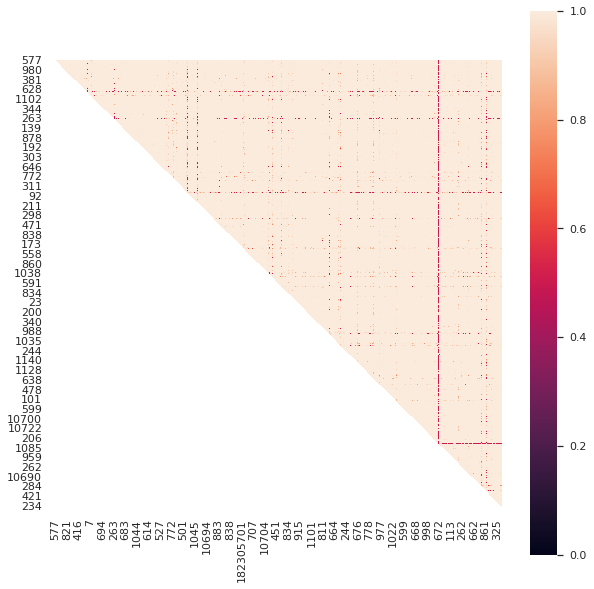

test set


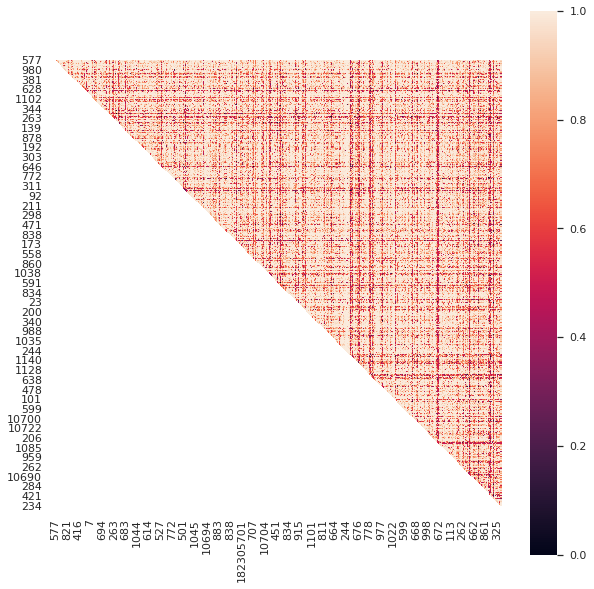

In [15]:
#first look at allbyall outfiles
print("train set")
uppertriheatmap(train_allbyall)
print("test set")
uppertriheatmap(test_allbyall)

are there any missing values after copying over diagonal?
False


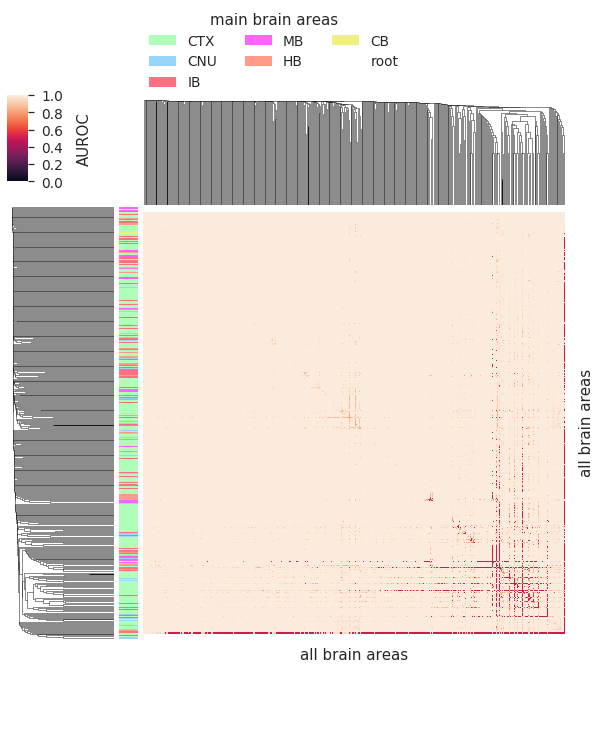

are there any missing values after copying over diagonal?
False


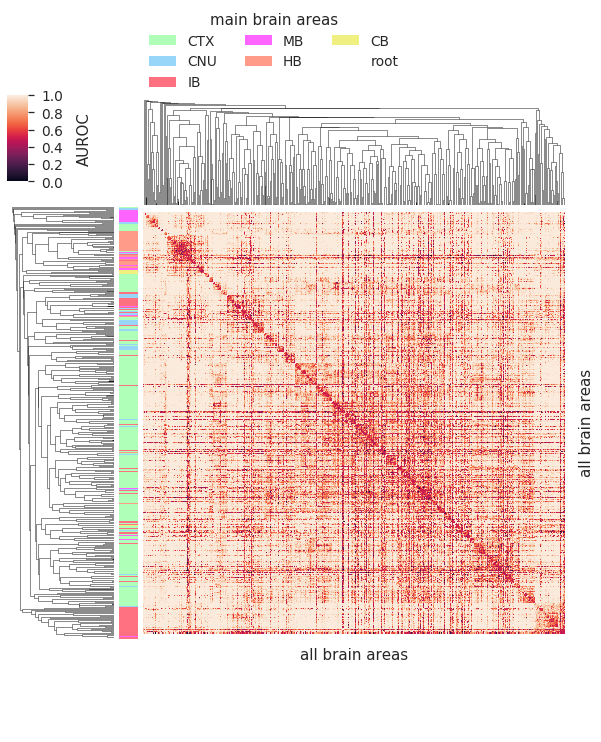

In [16]:
#clustermaps
clustermap(train_allbyall, ontology, False)
clustermap(test_allbyall, ontology, False)

number of 0's in upper triangular: 0


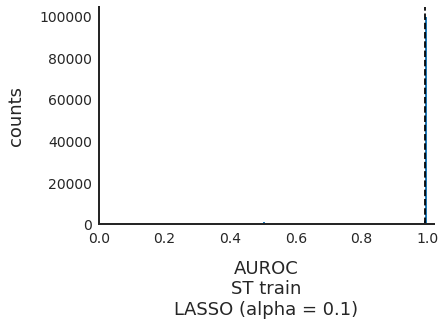

mean AUROC for upper triangular: 0.993265
number of 0's in upper triangular: 22


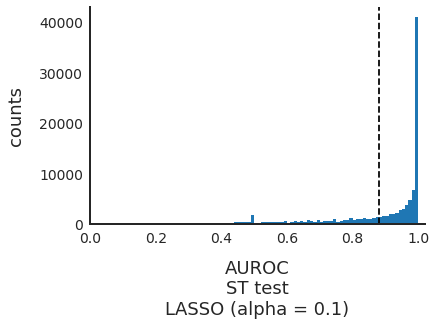

mean AUROC for upper triangular: 0.880212


In [17]:
#upper triangular histogram
uppertrihist(train_allbyall, "AUROC\nST train\nLASSO (alpha = 0.1)", 0, 0, 0, False)#"051120_3.pdf")
uppertrihist(test_allbyall, "AUROC\nST test\nLASSO (alpha = 0.1)", 0, 0, 0, False)#"051120_4.pdf")
#uppertrihist(test_allbyall, "AUROC\nST test\nLASSO (alpha = 0.1)", 1, 0, 100000, "051120_5.pdf")

__probe AUROCs = 0 in test set__

In [94]:
total, minsize, maxsize = getsizes(STpropont, test_allbyall)

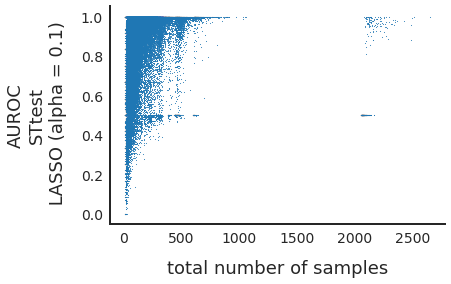

In [46]:
aurocbysize(total, test_allbyall, "total number of samples", "AUROC\nSTtest\n LASSO (alpha = 0.1)", False)

In [67]:
fold1testzeros = np.where(test_allbyall.values[np.triu_indices_from(test_allbyall,k=1)] == 0)

In [73]:
total.values[np.triu_indices_from(total, k=1)][fold1testzeros]

array([16., 12., 17., 12., 13., 13., 13., 19., 14., 12., 25., 12., 12.,
       16., 15., 18., 14., 22., 14., 13., 16., 13.])

### fold 2

__read in all by all files__

In [48]:
TRAIN_ALLBYALL_PATH = "/home/slu/spatial/data/allbyall_lasso/allbyallST0p1_f2_train0508.csv"
TEST_ALLBYALL_PATH = "/home/slu/spatial/data/allbyall_lasso/allbyallST0p1_f2_test0508.csv"

In [49]:
train_allbyall_f2 = pd.read_csv(TRAIN_ALLBYALL_PATH, sep=',')
train_allbyall_f2 = train_allbyall_f2.set_index(train_allbyall_f2.columns)

test_allbyall_f2 = pd.read_csv(TEST_ALLBYALL_PATH, sep=',')
test_allbyall_f2 = test_allbyall_f2.set_index(test_allbyall_f2.columns)

__plots__

train set


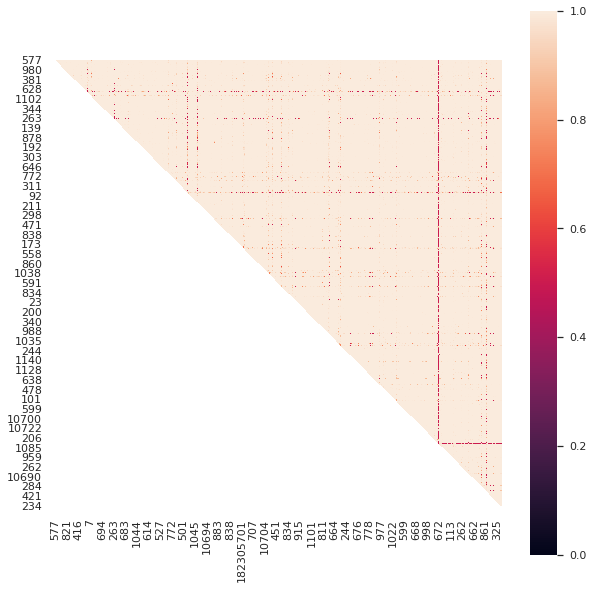

test set


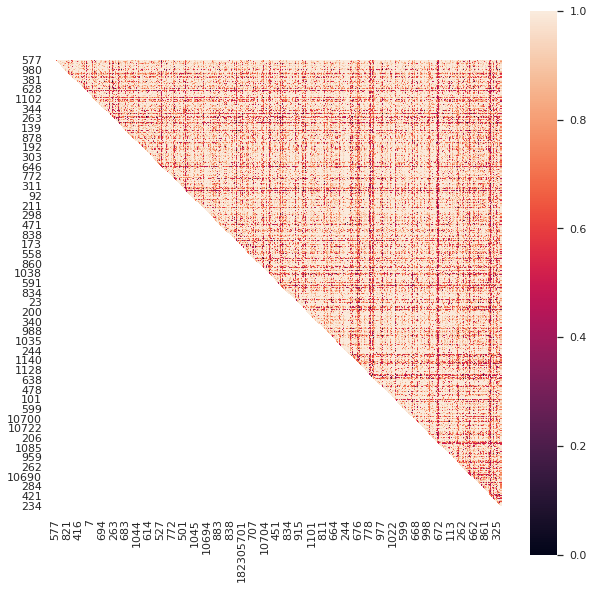

In [19]:
#first look at allbyall outfiles
print("train set")
uppertriheatmap(train_allbyall_f2)
print("test set")
uppertriheatmap(test_allbyall_f2)

are there any missing values after copying over diagonal?
False


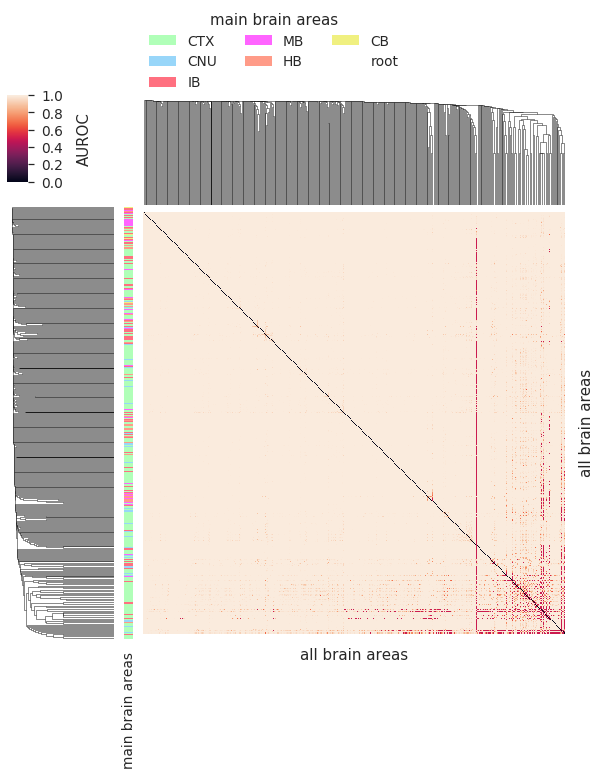

are there any missing values after copying over diagonal?
False


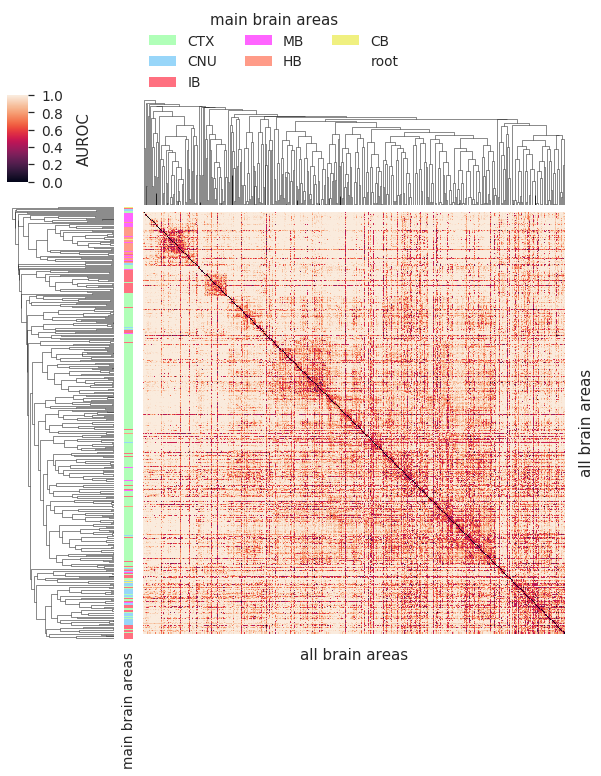

In [20]:
#clustermaps
clustermap(train_allbyall_f2, ontology, "051120_5.png")
clustermap(test_allbyall_f2, ontology, "051120_6.png")

number of 0's in upper triangular: 0


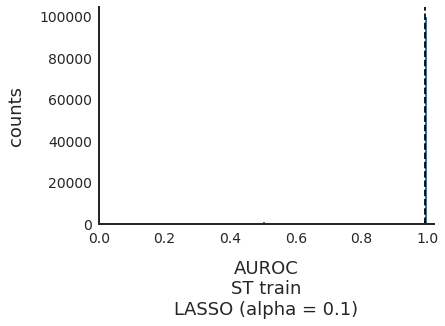

mean AUROC for upper triangular: 0.993528
number of 0's in upper triangular: 19


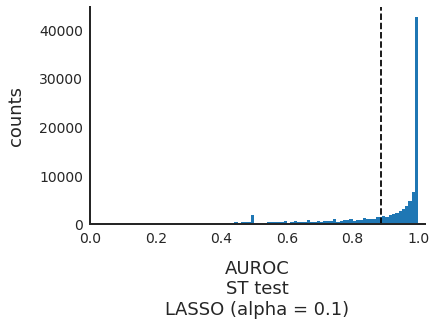

mean AUROC for upper triangular: 0.885669


In [20]:
#upper triangular histogram
uppertrihist(train_allbyall_f2, "AUROC\nST train\nLASSO (alpha = 0.1)", 0, 0, 0, False)#"051120_7.pdf")
uppertrihist(test_allbyall_f2, "AUROC\nST test\nLASSO (alpha = 0.1)", 0, 0, 0, False)#"051120_8.pdf")
#uppertrihist(test_allbyall, "AUROC\nST test\nLASSO (alpha = 0.1)", 1, 0, 100000, "040720_5.pdf")

__probe AUROCs = 0 in test set__

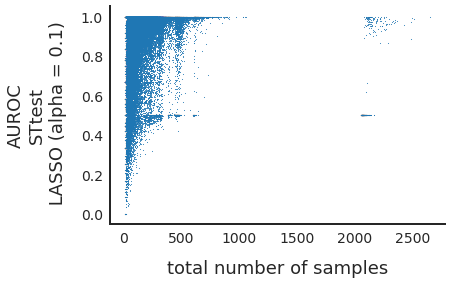

In [84]:
aurocbysize(total, test_allbyall_f2, "total number of samples", "AUROC\nSTtest\n LASSO (alpha = 0.1)", False)

In [85]:
fold2testzeros = np.where(test_allbyall_f2.values[np.triu_indices_from(test_allbyall_f2,k=1)] == 0)

In [86]:
total.values[np.triu_indices_from(total, k=1)][fold2testzeros]

array([16., 16., 17., 13., 19., 13., 13., 14., 15., 13., 13., 15., 17.,
       16., 13., 15., 15., 15., 14.])

In [90]:
test_allbyall_f2.values[np.triu_indices_from(test_allbyall_f2,k=1)][fold1testzeros]

array([0.46666667, 0.61111111, 0.6       , 0.33333333, 0.77777778,
       1.        , 1.        , 0.5       , 0.5       , 1.        ,
       0.625     , 0.33333333, 0.11111111, 0.9       , 0.79166667,
       0.1       , 0.5       , 0.95833333, 0.75      , 0.66666667,
       0.23333333, 0.77777778])

In [91]:
test_allbyall.values[np.triu_indices_from(test_allbyall,k=1)][fold2testzeros]

array([0.375     , 0.4       , 0.6       , 0.58333333, 0.69047619,
       0.91666667, 0.75      , 0.25      , 0.625     , 0.58333333,
       0.33333333, 0.9375    , 0.66666667, 0.46666667, 0.5       ,
       0.34375   , 0.93333333, 0.1875    , 0.33333333])

### cross validation

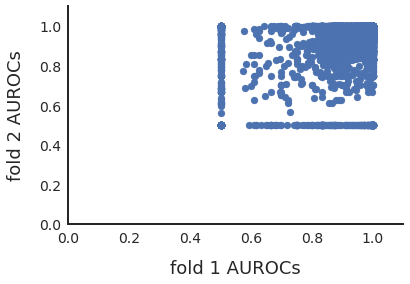

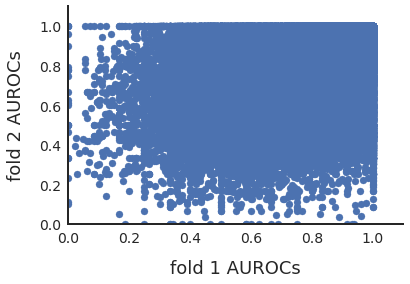

In [22]:
scatfolds(train_allbyall, train_allbyall_f2, 0)
scatfolds(test_allbyall, test_allbyall_f2, 0)

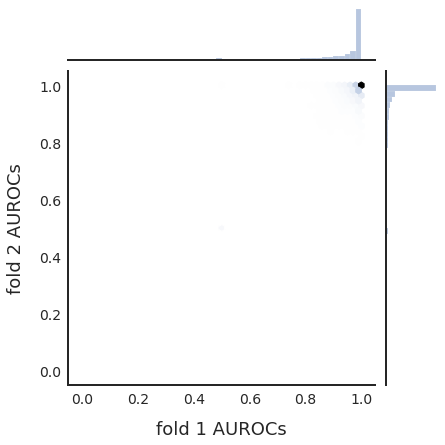

In [23]:
scatfolds2(test_allbyall, test_allbyall_f2, 0)

__average of the two test folds__

In [50]:
test_allbyall_avg = (test_allbyall + test_allbyall_f2)/2
split1 = test_allbyall_avg #new var name to compare to new split later

are there any missing values after copying over diagonal?
False


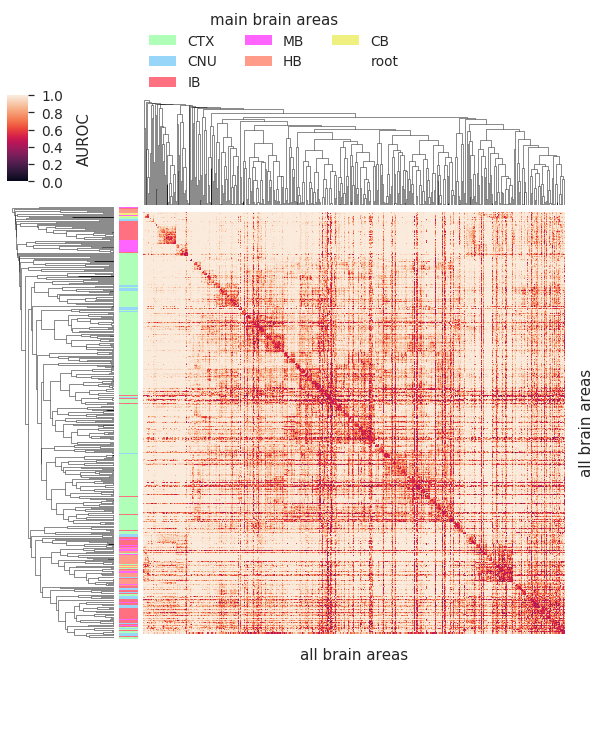

In [51]:
#clustermaps
clustermap(test_allbyall_avg, ontology, "072920_1.png")

number of 0's in upper triangular: 0


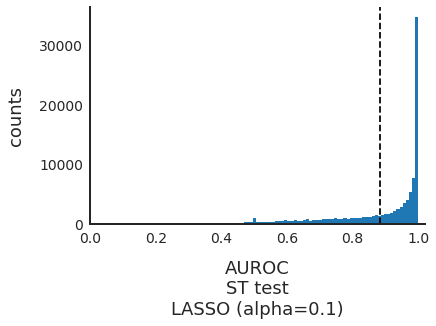

mean AUROC for upper triangular: 0.882940


In [92]:
#upper triangular histogram
uppertrihist(test_allbyall_avg, "AUROC\nST test\nLASSO (alpha=0.1)", 0, 0, 0, False)#"051120_10.pdf")

number of 0's in upper triangular: 0


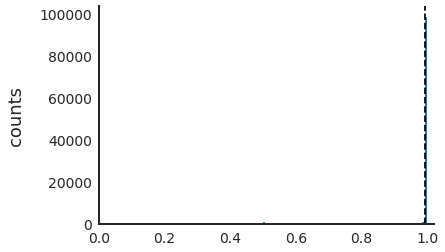

mean AUROC for upper triangular: 0.993397


In [24]:
#train fold for summary plot
train_allbyall_avg = (train_allbyall + train_allbyall_f2)/2
uppertrihist(train_allbyall_avg,"",0,0,0,False)

# Catin ST LASSO all by all alpha = 0.1 (new split, seed=9)

added Mar 2021

### fold 1

__read in all by all files__

In [52]:
TRAIN_ALLBYALL_PATH = "/home/slu/spatial/data/allbyall_lasso/allbyallST0p1newsplit_f1_train031721.csv"
TEST_ALLBYALL_PATH = "/home/slu/spatial/data/allbyall_lasso/allbyallST0p1newsplit_f1_test031721.csv"

In [53]:
train_allbyall = pd.read_csv(TRAIN_ALLBYALL_PATH, sep=',')
train_allbyall = train_allbyall.set_index(train_allbyall.columns)

test_allbyall = pd.read_csv(TEST_ALLBYALL_PATH, sep=',')
test_allbyall = test_allbyall.set_index(test_allbyall.columns)

In [16]:
train_allbyall.shape

(461, 461)

__plots__

train set


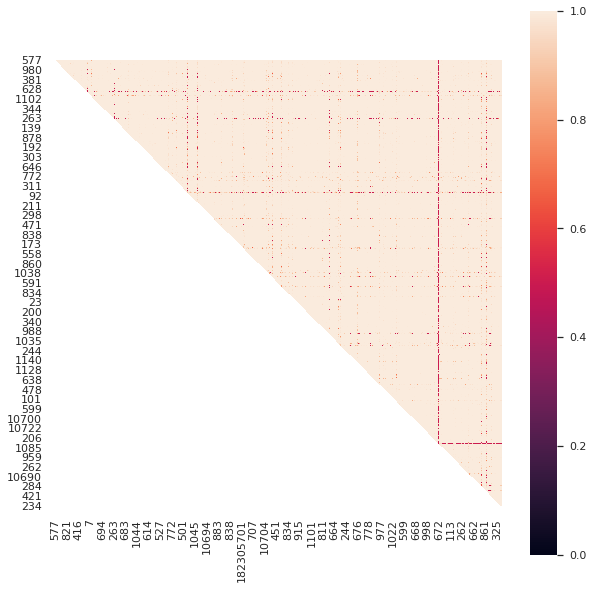

test set


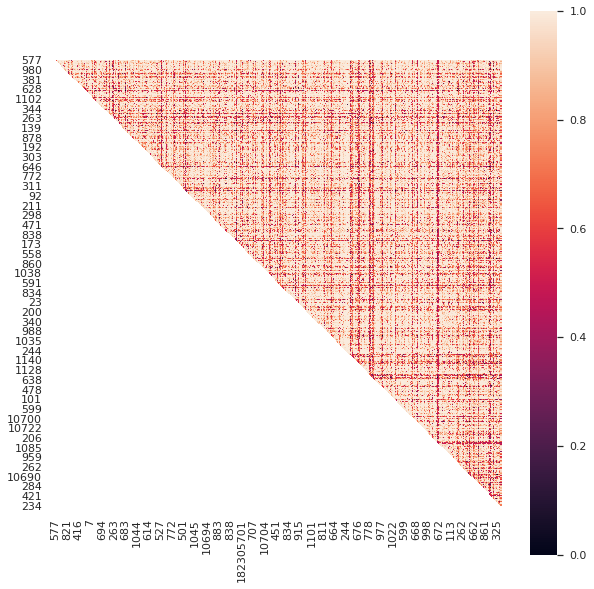

In [15]:
#first look at allbyall outfiles
print("train set")
uppertriheatmap(train_allbyall)
print("test set")
uppertriheatmap(test_allbyall)

are there any missing values after copying over diagonal?
False


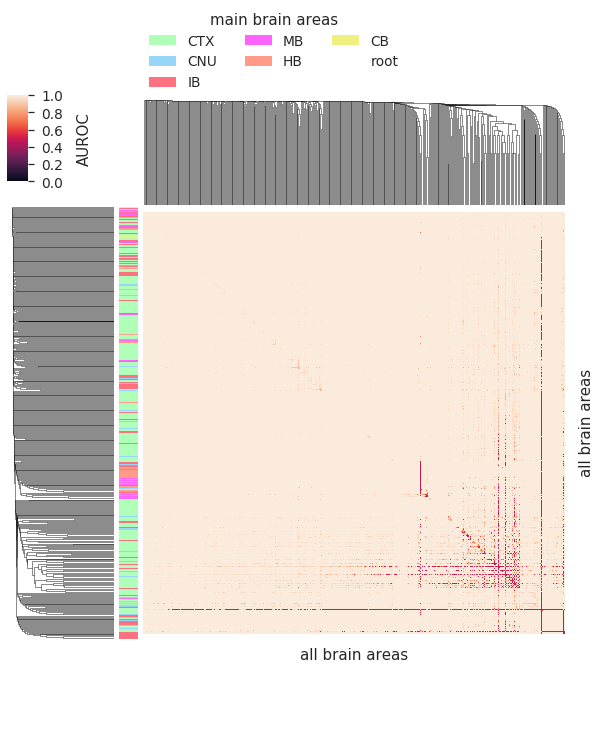

are there any missing values after copying over diagonal?
False


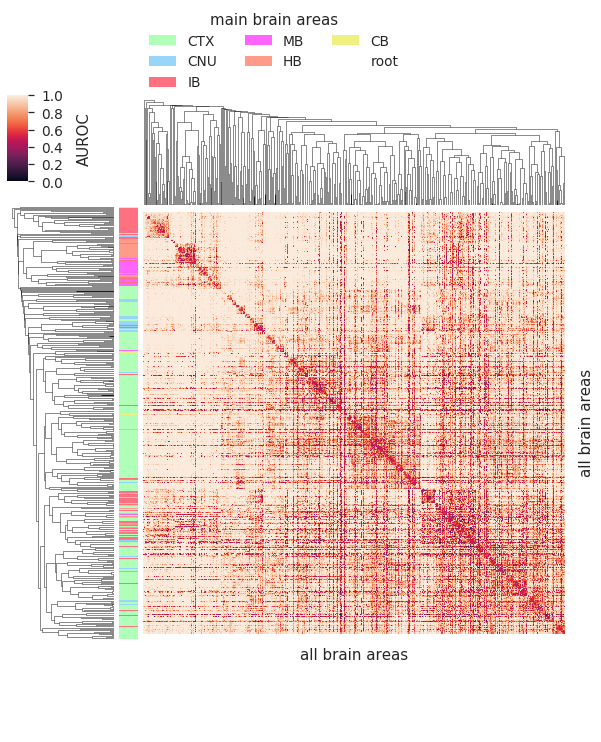

In [16]:
#clustermaps
clustermap(train_allbyall, ontology, "031821_1.png") #can change last param to png file name to save
clustermap(test_allbyall, ontology, "031821_2.png")

number of 0's in upper triangular: 0


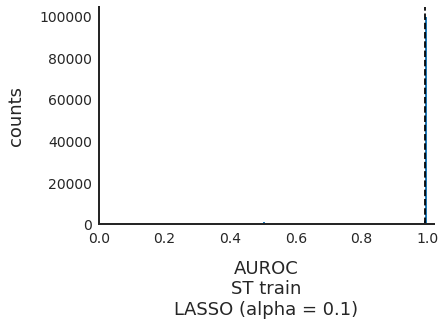

mean AUROC for upper triangular: 0.993519
number of 0's in upper triangular: 25


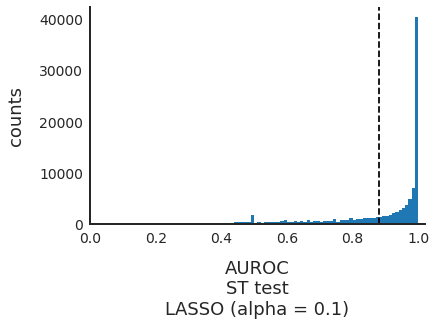

mean AUROC for upper triangular: 0.879018


In [17]:
#upper triangular histogram
uppertrihist(train_allbyall, "AUROC\nST train\nLASSO (alpha = 0.1)", 0, 0, 0, False)
uppertrihist(test_allbyall, "AUROC\nST test\nLASSO (alpha = 0.1)", 0, 0, 0, False)
#uppertrihist(test_allbyall, "AUROC\nST test\nLASSO (alpha = 0.1)", 1, 0, 100000, "051120_5.pdf")

### fold 2

__read in all by all files__

In [54]:
TRAIN_ALLBYALL_PATH = "/home/slu/spatial/data/allbyall_lasso/allbyallST0p1newsplit_f2_train031721.csv"
TEST_ALLBYALL_PATH = "/home/slu/spatial/data/allbyall_lasso/allbyallST0p1newsplit_f2_test031721.csv"

In [55]:
train_allbyall_f2 = pd.read_csv(TRAIN_ALLBYALL_PATH, sep=',')
train_allbyall_f2 = train_allbyall_f2.set_index(train_allbyall_f2.columns)

test_allbyall_f2 = pd.read_csv(TEST_ALLBYALL_PATH, sep=',')
test_allbyall_f2 = test_allbyall_f2.set_index(test_allbyall_f2.columns)

__plots__

train set


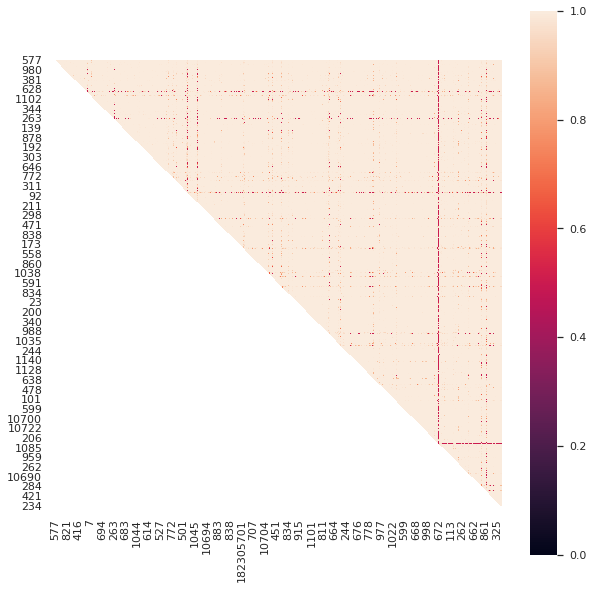

test set


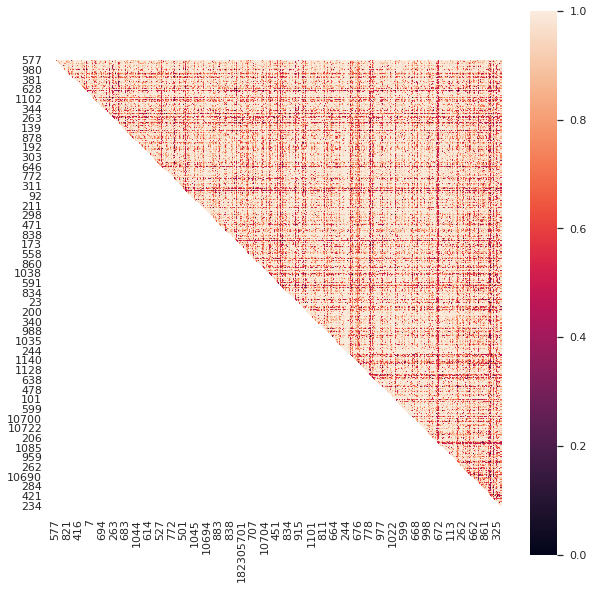

In [22]:
#first look at allbyall outfiles
print("train set")
uppertriheatmap(train_allbyall_f2)
print("test set")
uppertriheatmap(test_allbyall_f2)

are there any missing values after copying over diagonal?
False


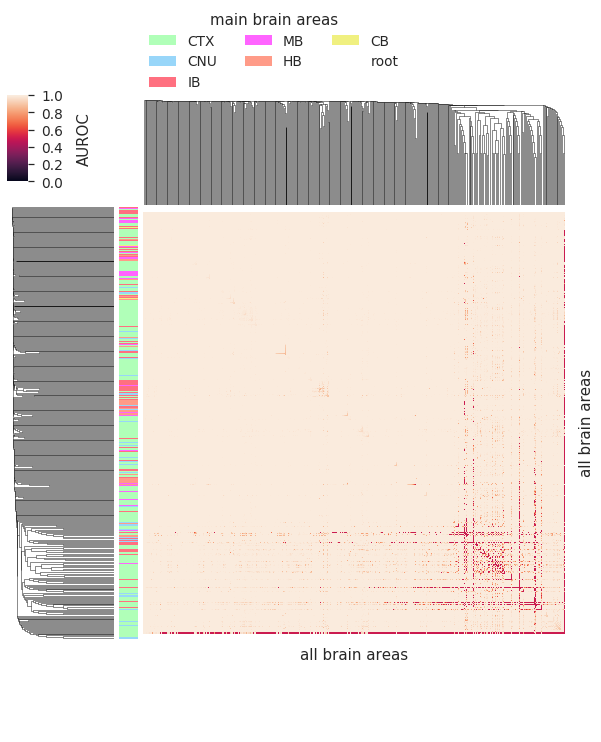

are there any missing values after copying over diagonal?
False


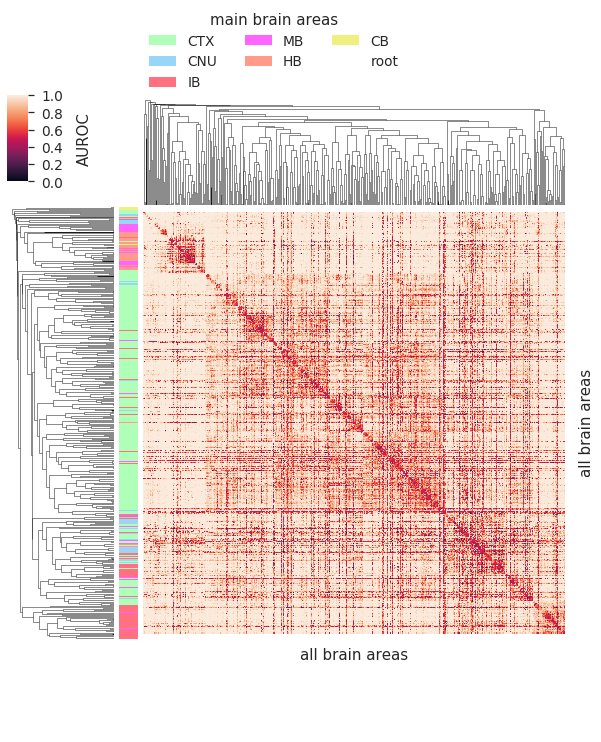

In [23]:
#clustermaps
clustermap(train_allbyall_f2, ontology, False)
clustermap(test_allbyall_f2, ontology, False) #last arg can be png file name to save

number of 0's in upper triangular: 0


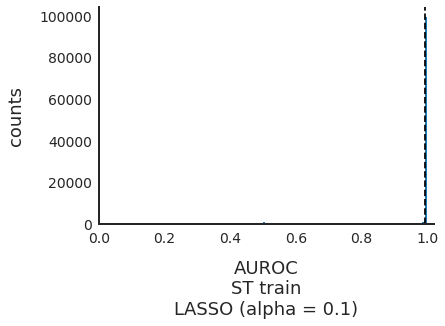

mean AUROC for upper triangular: 0.993315
number of 0's in upper triangular: 24


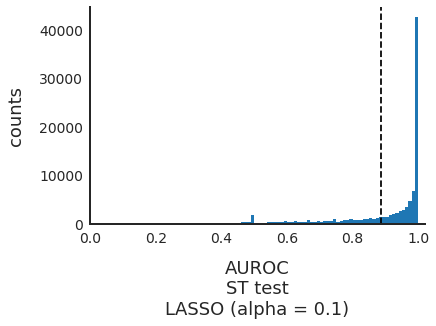

mean AUROC for upper triangular: 0.885347


In [20]:
#upper triangular histogram
uppertrihist(train_allbyall_f2, "AUROC\nST train\nLASSO (alpha = 0.1)", 0, 0, 0, False)
uppertrihist(test_allbyall_f2, "AUROC\nST test\nLASSO (alpha = 0.1)", 0, 0, 0, False)
#uppertrihist(test_allbyall, "AUROC\nST test\nLASSO (alpha = 0.1)", 1, 0, 100000, "040720_5.pdf")

### cross validation

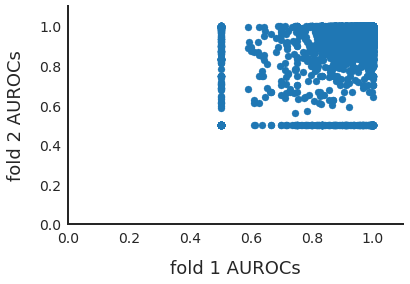

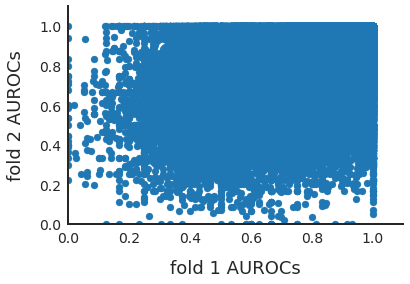

In [21]:
scatfolds(train_allbyall, train_allbyall_f2, 0)
scatfolds(test_allbyall, test_allbyall_f2, 0)

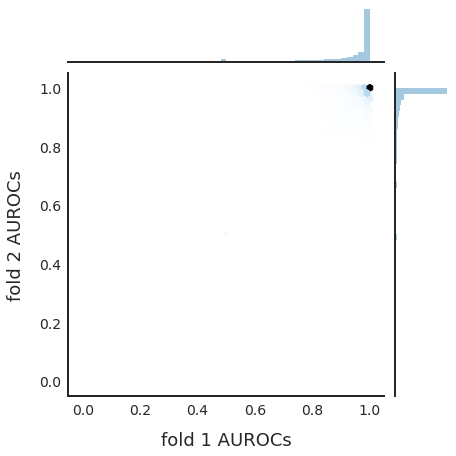

In [22]:
scatfolds2(test_allbyall, test_allbyall_f2, 0)

__average of the two test folds__

In [56]:
test_allbyall_avg = (test_allbyall + test_allbyall_f2)/2
split2 = test_allbyall_avg #new var name to calc SD b/t two splits

are there any missing values after copying over diagonal?
False


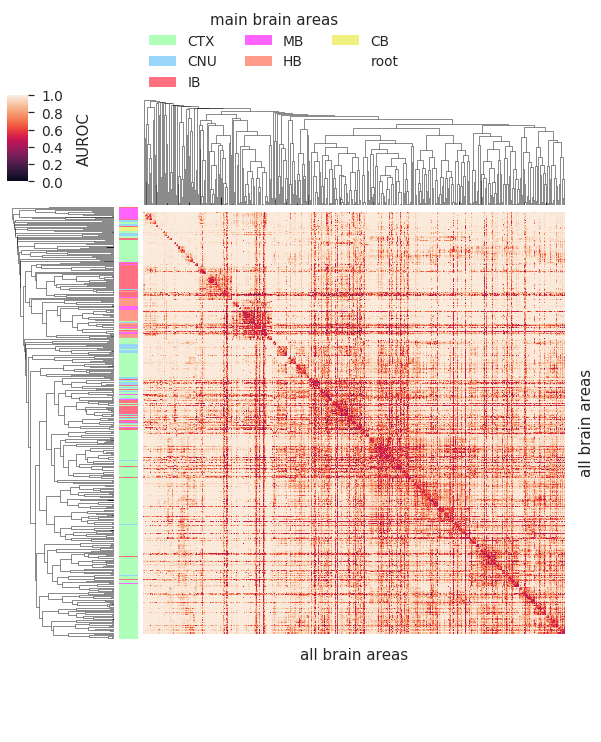

In [28]:
#clustermaps
clustermap(test_allbyall_avg, ontology, "031821_1.png")

number of 0's in upper triangular: 0


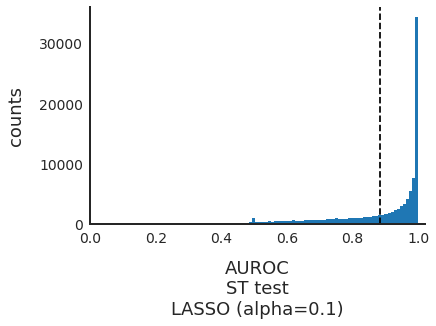

mean AUROC for upper triangular: 0.882183


In [24]:
#upper triangular histogram
uppertrihist(test_allbyall_avg, "AUROC\nST test\nLASSO (alpha=0.1)", 0, 0, 0, False)#"031821_2.pdf")

number of 0's in upper triangular: 0


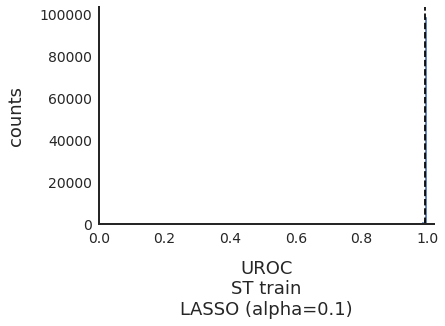

mean AUROC for upper triangular: 0.993417


In [31]:
#train fold for summary plot
train_allbyall_avg = (train_allbyall + train_allbyall_f2)/2
uppertrihist(train_allbyall_avg,"UROC\nST train\nLASSO (alpha=0.1)",0,0,0,"031821_3.pdf")

calculate difference between the two train/test splits

In [57]:
split1 = split1.values[np.triu_indices_from(split1,k=1)]
split2 = split2.values[np.triu_indices_from(split2,k=1)]

In [59]:
np.corrcoef(split1,split2)

array([[1.       , 0.8217104],
       [0.8217104, 1.       ]])

In [60]:
sp.stats.spearmanr(split1, split2)

SpearmanrResult(correlation=0.8598729317082172, pvalue=0.0)

In [61]:
def distyx(xdata, ydata):
    """takes in x and y data of a scatter plot and returns the average distance from the y=x line"""
    p1 = np.array([0,0])
    p2 = np.array([1,1])
    dists = []
    for i in range(len(xdata)):
        p3 = np.array([xdata[i],ydata[i]])
        dists.append(np.cross(p2-p1,p3-p1)/np.linalg.norm(p2-p1))
    return np.nanmean(np.abs(dists))

In [62]:
distyx(split1, split2)

0.036313282040237226

# Catin ST LASSO all by all alpha = 0 (linear regression)

### fold 1

__read in all by all files__

In [41]:
TRAIN_ALLBYALL_PATH = "/home/slu/spatial/data/allbyall_lasso/allbyallST0_f1_train0508.csv"
TEST_ALLBYALL_PATH = "/home/slu/spatial/data/allbyall_lasso/allbyallST0_f1_test0508.csv"

In [42]:
train_allbyall = pd.read_csv(TRAIN_ALLBYALL_PATH, sep=',')
train_allbyall = train_allbyall.set_index(train_allbyall.columns)

test_allbyall = pd.read_csv(TEST_ALLBYALL_PATH, sep=',')
test_allbyall = test_allbyall.set_index(test_allbyall.columns)

__plots__

train set


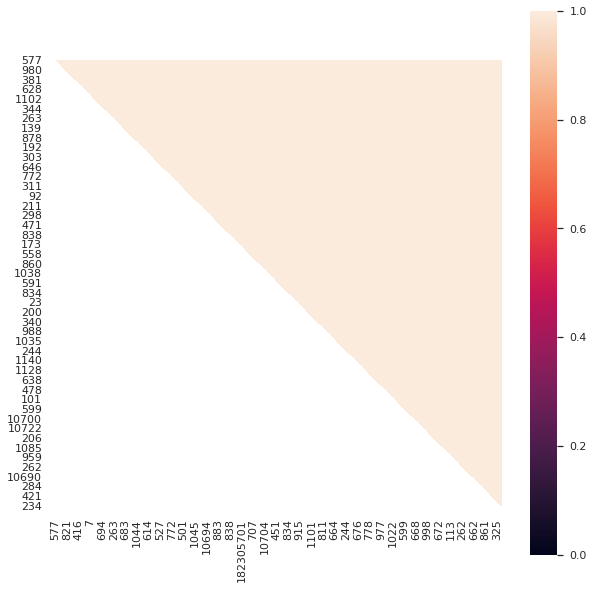

test set


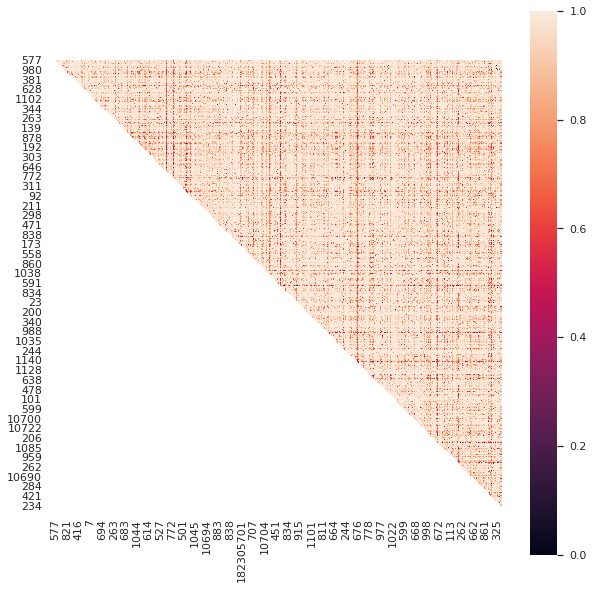

In [16]:
#first look at allbyall outfiles
print("train set")
uppertriheatmap(train_allbyall)
print("test set")
uppertriheatmap(test_allbyall)

are there any missing values after copying over diagonal?
False


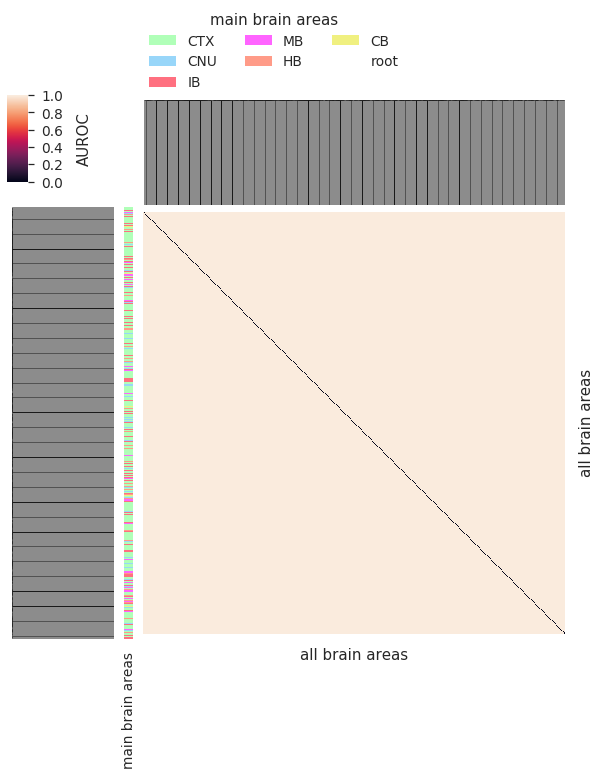

are there any missing values after copying over diagonal?
False


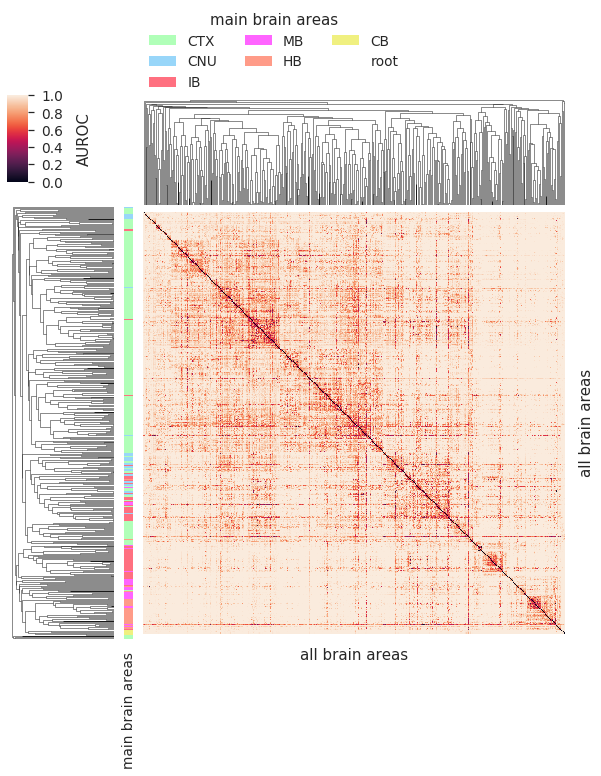

In [33]:
#clustermaps
clustermap(train_allbyall, ontology, "051120_11.png")
clustermap(test_allbyall, ontology, "051120_12.png")

number of 0's in upper triangular: 0


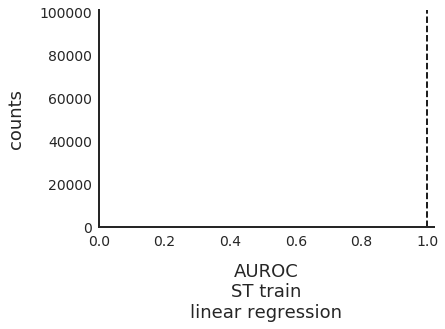

mean AUROC for upper triangular: 1.000000
number of 0's in upper triangular: 1


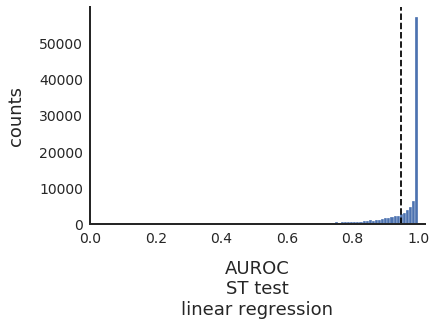

mean AUROC for upper triangular: 0.947063


In [34]:
#upper triangular histogram
uppertrihist(train_allbyall, "AUROC\nST train\nlinear regression", 0, 0, 0, '051120_13.pdf')
uppertrihist(test_allbyall, "AUROC\nST test\nlinear regression", 0, 0, 0, '051120_14.pdf')
#uppertrihist(test_allbyall, "AUROC\nST test\nLASSO (alpha = 0.1)", 1, 0, 100000, "040720_5.pdf")

__probe AUROCs = 0 in test set__

In [17]:
total, minsize, maxsize = getsizes(STpropont, test_allbyall)

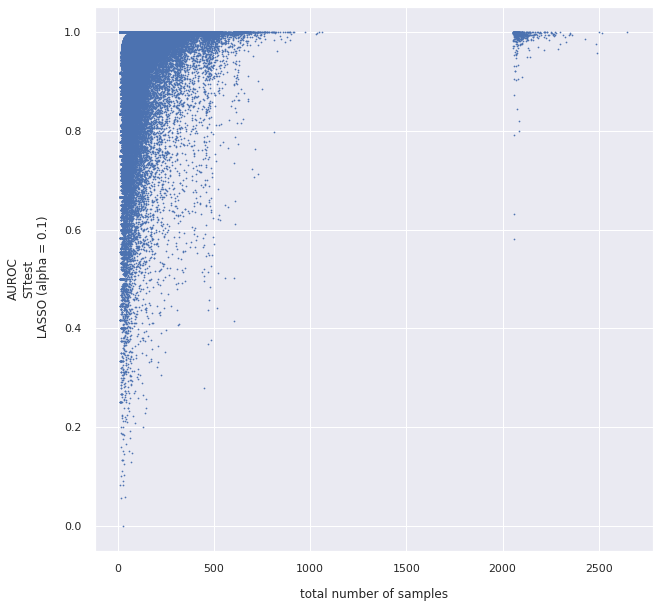

In [18]:
aurocbysize(total, test_allbyall, "total number of samples", "AUROC\nSTtest\n LASSO (alpha = 0.1)", False)

In [19]:
fold1testzeros = np.where(test_allbyall.values[np.triu_indices_from(test_allbyall,k=1)] == 0)

In [20]:
total.values[np.triu_indices_from(total, k=1)][fold1testzeros]

array([26.])

### fold 2

__read in all by all files__

In [43]:
TRAIN_ALLBYALL_PATH = "/home/slu/spatial/data/allbyall_lasso/allbyallST0_f2_train0508.csv"
TEST_ALLBYALL_PATH = "/home/slu/spatial/data/allbyall_lasso/allbyallST0_f2_test0508.csv"

In [44]:
train_allbyall_f2 = pd.read_csv(TRAIN_ALLBYALL_PATH, sep=',')
train_allbyall_f2 = train_allbyall_f2.set_index(train_allbyall_f2.columns)

test_allbyall_f2 = pd.read_csv(TEST_ALLBYALL_PATH, sep=',')
test_allbyall_f2 = test_allbyall_f2.set_index(test_allbyall_f2.columns)

__plots__

train set


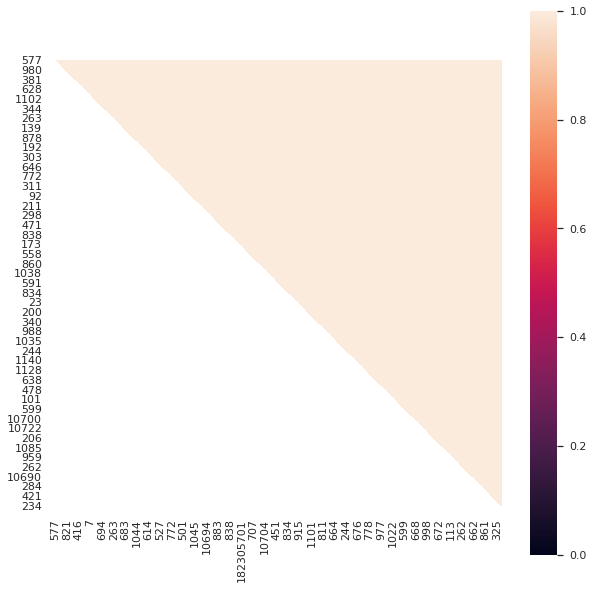

test set


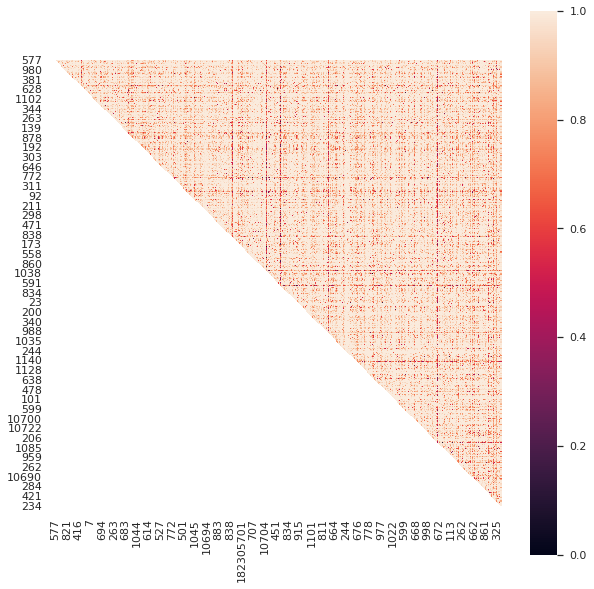

In [37]:
#first look at allbyall outfiles
print("train set")
uppertriheatmap(train_allbyall_f2)
print("test set")
uppertriheatmap(test_allbyall_f2)

are there any missing values after copying over diagonal?
False


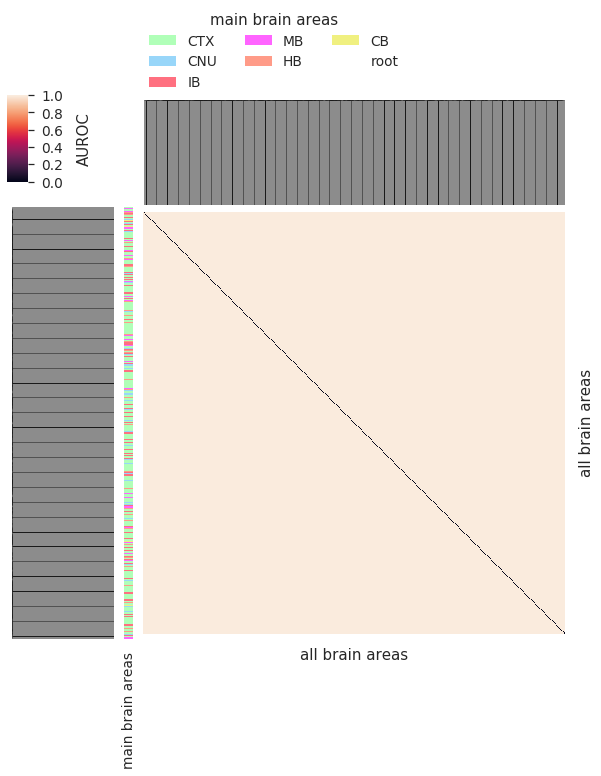

are there any missing values after copying over diagonal?
False


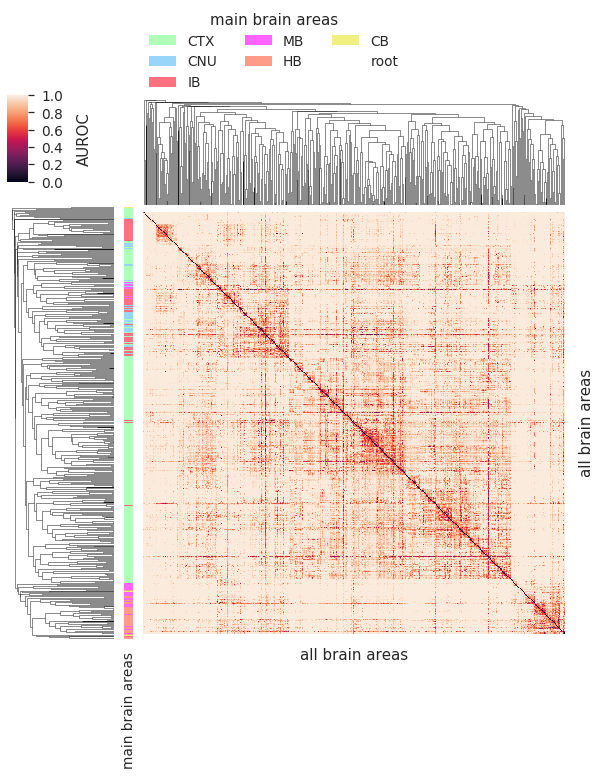

In [38]:
#clustermaps
clustermap(train_allbyall_f2, ontology, "051120_15.png")
clustermap(test_allbyall_f2, ontology, "051120_16.png")

number of 0's in upper triangular: 0


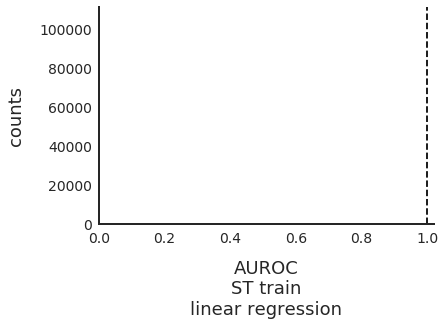

mean AUROC for upper triangular: 1.000000
number of 0's in upper triangular: 0


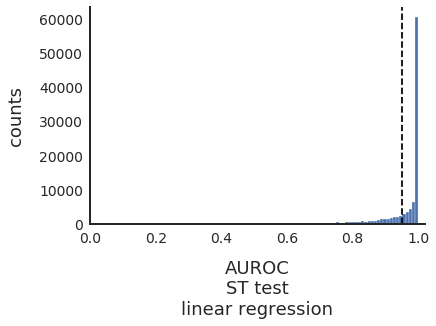

mean AUROC for upper triangular: 0.950660


In [39]:
#upper triangular histogram
uppertrihist(train_allbyall_f2, "AUROC\nST train\nlinear regression", 0, 0, 0, "051120_17.pdf")
uppertrihist(test_allbyall_f2, "AUROC\nST test\nlinear regression", 0, 0, 0, "051120_18.pdf")
#uppertrihist(test_allbyall, "AUROC\nST test\nLASSO (alpha = 0.1)", 1, 0, 100000, "040720_5.pdf")

### cross validation

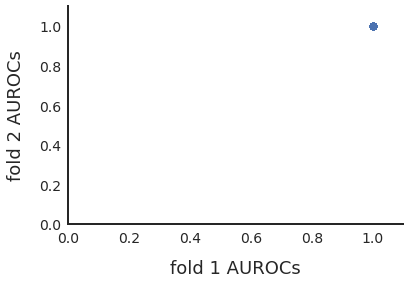

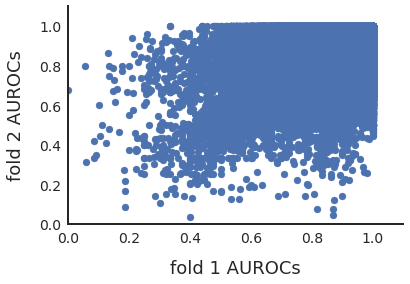

In [40]:
scatfolds(train_allbyall, train_allbyall_f2, 0)
scatfolds(test_allbyall, test_allbyall_f2, 0)

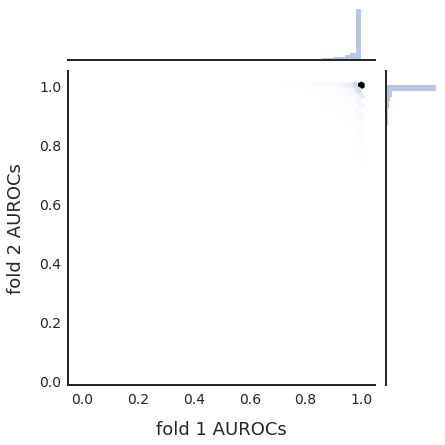

In [41]:
scatfolds2(test_allbyall, test_allbyall_f2, 0)

__probe AUROCs = 0 in test set__

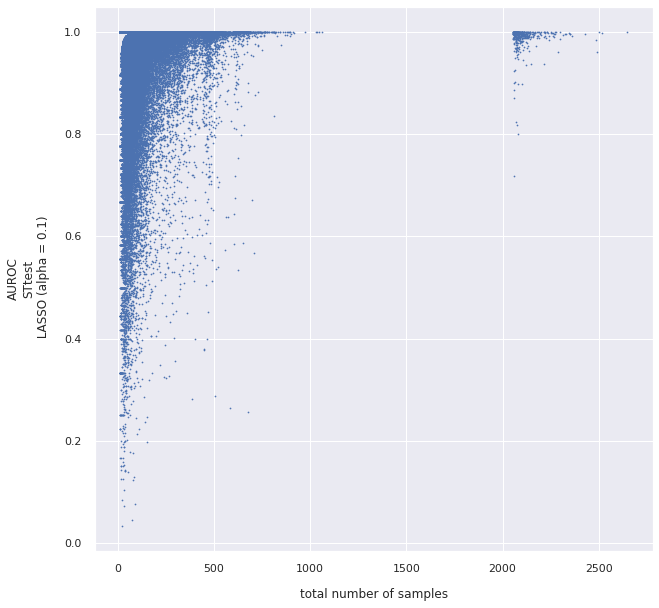

In [23]:
aurocbysize(total, test_allbyall_f2, "total number of samples", "AUROC\nSTtest\n LASSO (alpha = 0.1)", False)

In [24]:
fold2testzeros = np.where(test_allbyall_f2.values[np.triu_indices_from(test_allbyall_f2,k=1)] == 0)

In [25]:
total.values[np.triu_indices_from(total, k=1)][fold2testzeros]

array([], dtype=float64)

In [26]:
test_allbyall_f2.values[np.triu_indices_from(test_allbyall_f2,k=1)][fold1testzeros]

array([0.675])

In [27]:
test_allbyall.values[np.triu_indices_from(test_allbyall,k=1)][fold2testzeros]

array([], dtype=float64)

__average of the two test folds__

In [45]:
test_allbyall_avg = (test_allbyall + test_allbyall_f2)/2

are there any missing values after copying over diagonal?
False


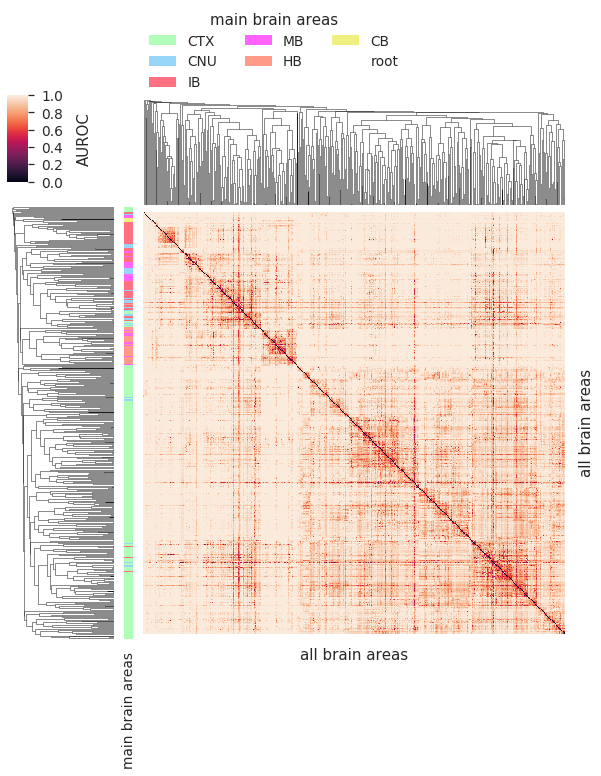

In [43]:
#clustermaps
clustermap(test_allbyall_avg, ontology, "051120_19.png")

number of 0's in upper triangular: 0


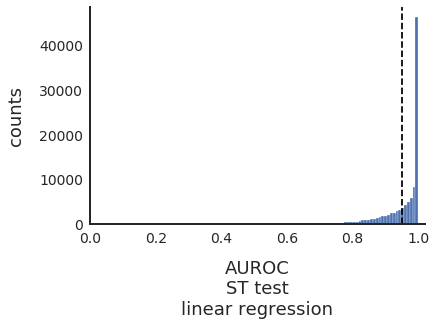

mean AUROC for upper triangular: 0.948857


In [46]:
#upper triangular histogram
uppertrihist(test_allbyall_avg, "AUROC\nST test\nlinear regression", 0, 0, 0, False)#"051120_20.pdf")

number of 0's in upper triangular: 0


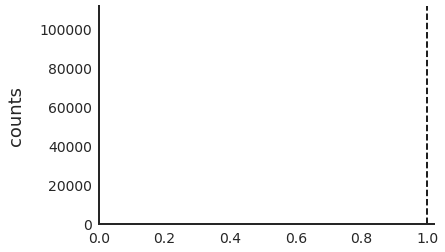

mean AUROC for upper triangular: 1.000000


In [47]:
#train fold for summary plot
train_allbyall_avg = (train_allbyall + train_allbyall_f2)/2
uppertrihist(train_allbyall_avg,"",0,0,0,False)

# Catin ST LASSO all by all alpha = 0.05

### fold 1

__read in all by all files__

In [48]:
TRAIN_ALLBYALL_PATH = "/home/slu/spatial/data/allbyall_lasso/allbyallST0p05_f1_train0510.csv"
TEST_ALLBYALL_PATH = "/home/slu/spatial/data/allbyall_lasso/allbyallST0p05_f1_test0510.csv"

In [49]:
train_allbyall = pd.read_csv(TRAIN_ALLBYALL_PATH, sep=',')
train_allbyall = train_allbyall.set_index(train_allbyall.columns)

test_allbyall = pd.read_csv(TEST_ALLBYALL_PATH, sep=',')
test_allbyall = test_allbyall.set_index(test_allbyall.columns)

__plots__

train set


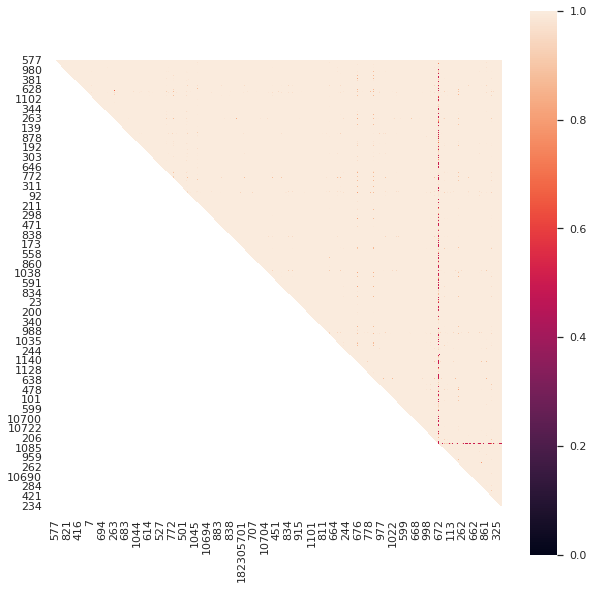

test set


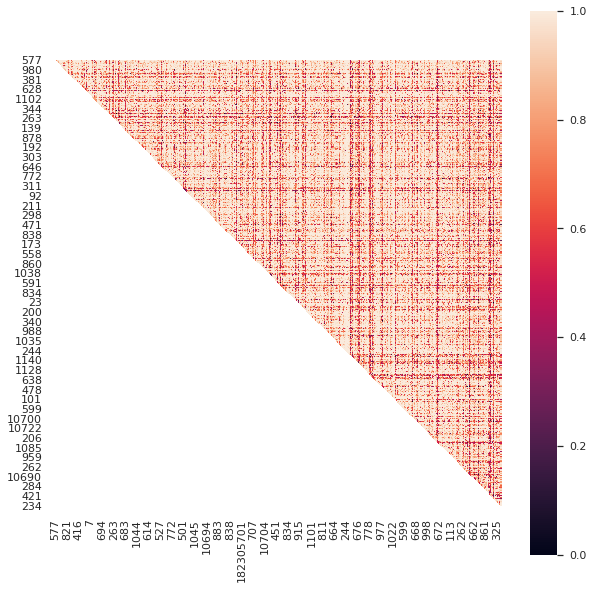

In [47]:
#first look at allbyall outfiles
print("train set")
uppertriheatmap(train_allbyall)
print("test set")
uppertriheatmap(test_allbyall)

are there any missing values after copying over diagonal?
False


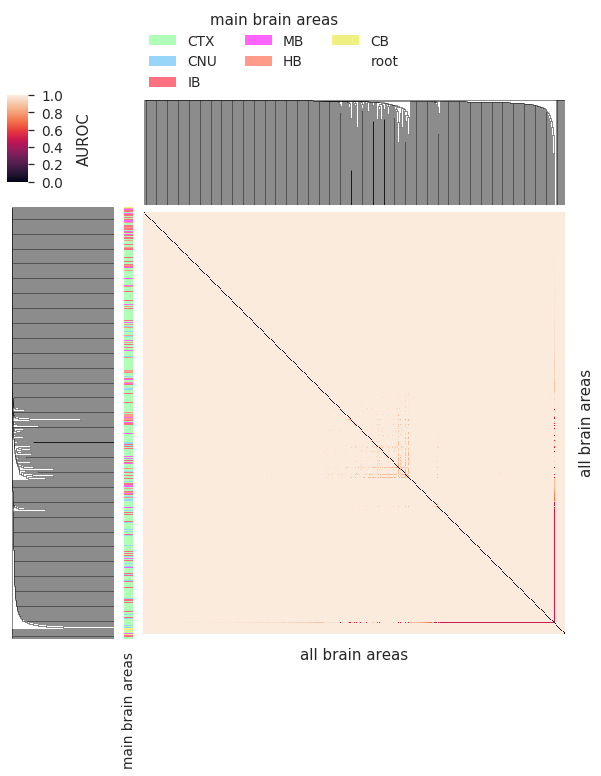

are there any missing values after copying over diagonal?
False


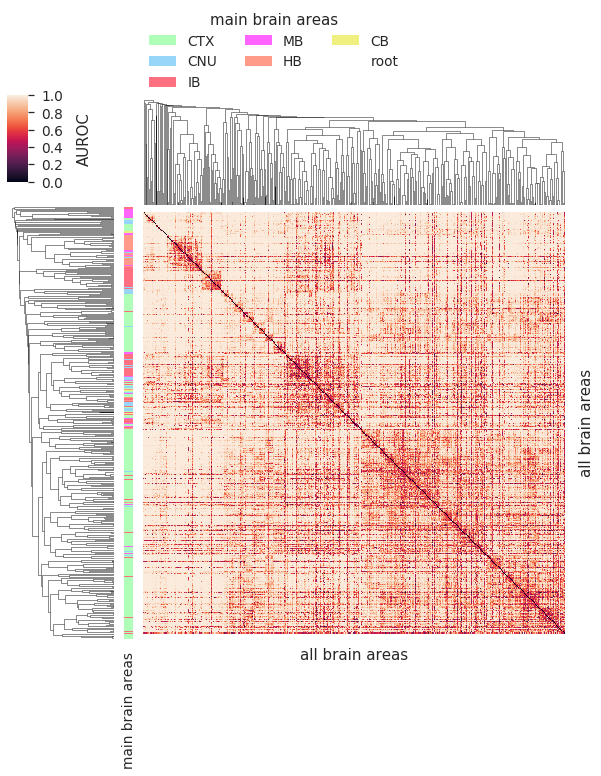

In [48]:
#clustermaps
clustermap(train_allbyall, ontology, "051120_21.png")
clustermap(test_allbyall, ontology, "051120_22.png")

number of 0's in upper triangular: 0


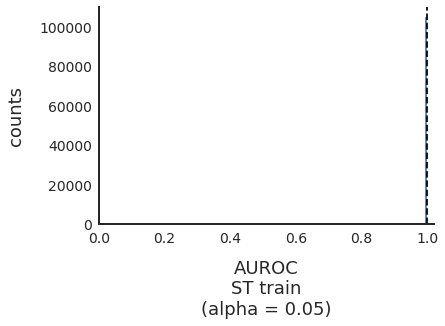

mean AUROC for upper triangular: 0.998931
number of 0's in upper triangular: 22


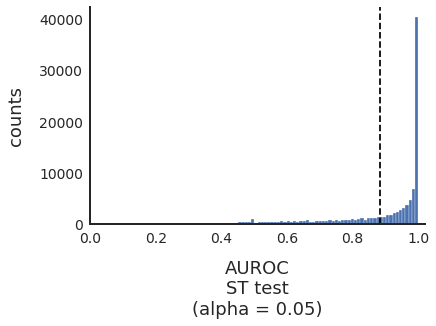

mean AUROC for upper triangular: 0.882092


In [49]:
#upper triangular histogram
uppertrihist(train_allbyall, "AUROC\nST train\n(alpha = 0.05)", 0, 0, 0, "051120_23.pdf")
uppertrihist(test_allbyall, "AUROC\nST test\n(alpha = 0.05)", 0, 0, 0, "051120_24.pdf")
#uppertrihist(test_allbyall, "AUROC\nST test\nLASSO (alpha = 0.1)", 1, 0, 100000, "040720_5.pdf")

__probe AUROCs = 0 in test set__

In [30]:
total, minsize, maxsize = getsizes(STpropont, test_allbyall)

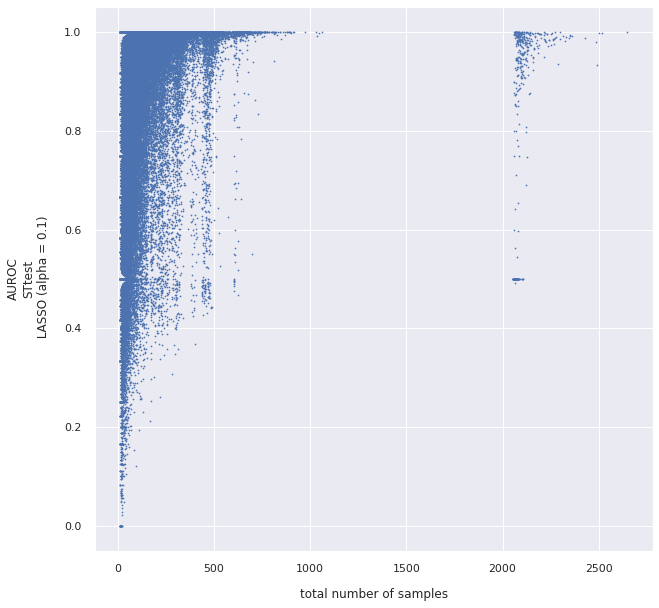

In [31]:
aurocbysize(total, test_allbyall, "total number of samples", "AUROC\nSTtest\n LASSO (alpha = 0.1)", False)

In [32]:
fold1testzeros = np.where(test_allbyall.values[np.triu_indices_from(test_allbyall,k=1)] == 0)

In [33]:
total.values[np.triu_indices_from(total, k=1)][fold1testzeros]

array([16., 12., 23., 17., 13., 13., 13., 19., 25., 12., 13., 12., 13.,
       14., 22., 19., 13., 14., 13., 16., 13., 13.])

### fold 2

__read in all by all files__

In [50]:
TRAIN_ALLBYALL_PATH = "/home/slu/spatial/data/allbyall_lasso/allbyallST0p05_f2_train0510.csv"
TEST_ALLBYALL_PATH = "/home/slu/spatial/data/allbyall_lasso/allbyallST0p05_f2_test0510.csv"

In [51]:
train_allbyall_f2 = pd.read_csv(TRAIN_ALLBYALL_PATH, sep=',')
train_allbyall_f2 = train_allbyall_f2.set_index(train_allbyall_f2.columns)

test_allbyall_f2 = pd.read_csv(TEST_ALLBYALL_PATH, sep=',')
test_allbyall_f2 = test_allbyall_f2.set_index(test_allbyall_f2.columns)

__plots__

train set


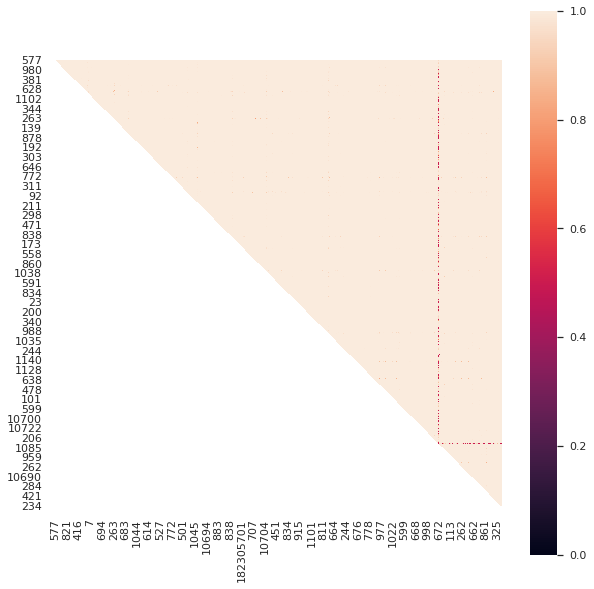

test set


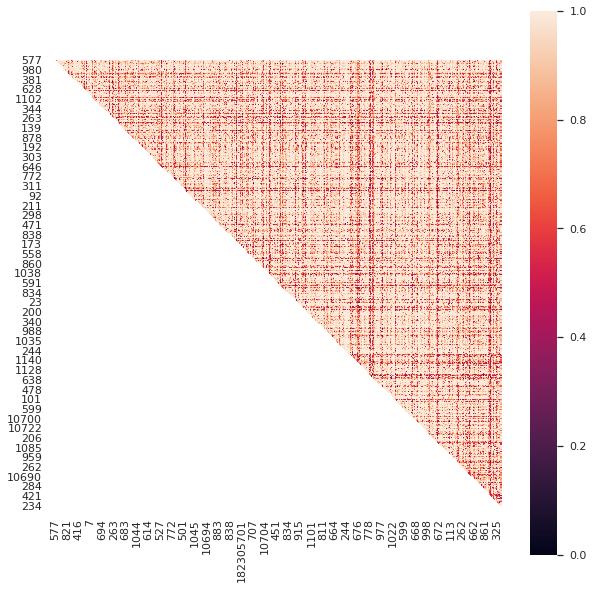

In [52]:
#first look at allbyall outfiles
print("train set")
uppertriheatmap(train_allbyall_f2)
print("test set")
uppertriheatmap(test_allbyall_f2)

are there any missing values after copying over diagonal?
False


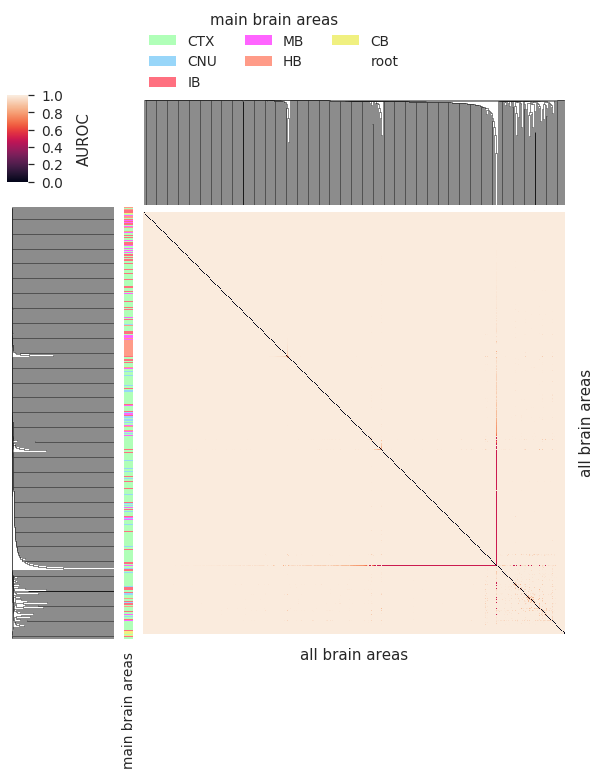

are there any missing values after copying over diagonal?
False


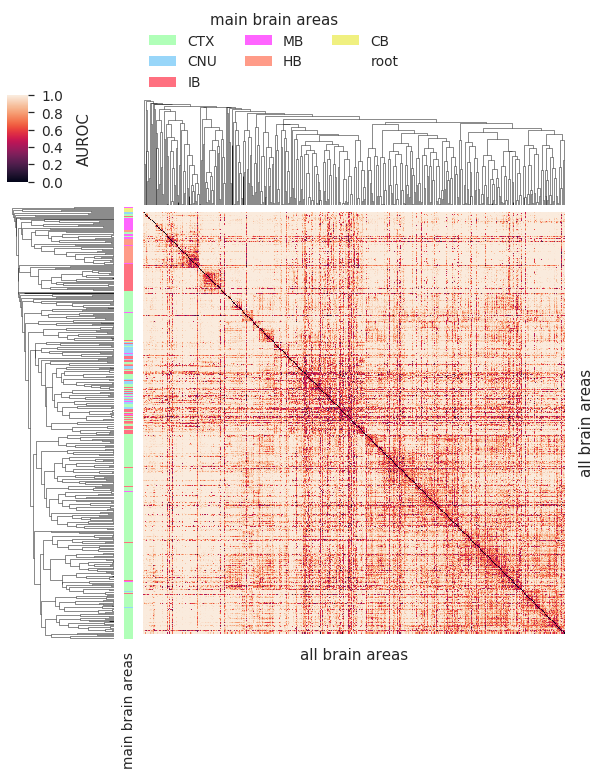

In [54]:
#clustermaps
clustermap(train_allbyall_f2, ontology, "051120_25.png")
clustermap(test_allbyall_f2, ontology, "051120_26.png")

number of 0's in upper triangular: 0


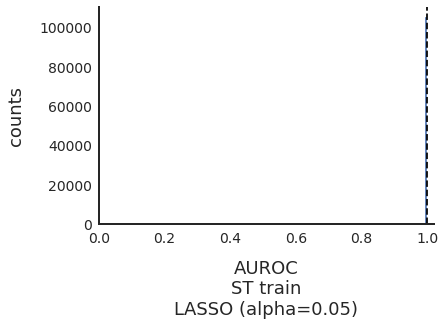

mean AUROC for upper triangular: 0.999044
number of 0's in upper triangular: 20


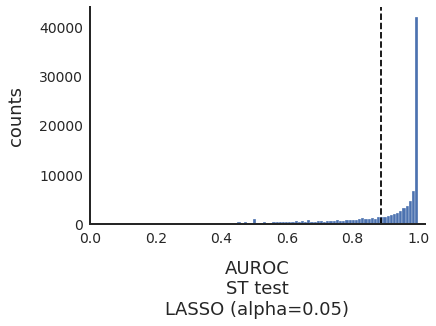

mean AUROC for upper triangular: 0.887332


In [55]:
#upper triangular histogram
uppertrihist(train_allbyall_f2, "AUROC\nST train\nLASSO (alpha=0.05)", 0, 0, 0, "051120_27.pdf")
uppertrihist(test_allbyall_f2, "AUROC\nST test\nLASSO (alpha=0.05)", 0, 0, 0, "051120_28.pdf")
#uppertrihist(test_allbyall, "AUROC\nST test\nLASSO (alpha = 0.1)", 1, 0, 100000, "040720_5.pdf")

__probe AUROCs = 0 in test set__

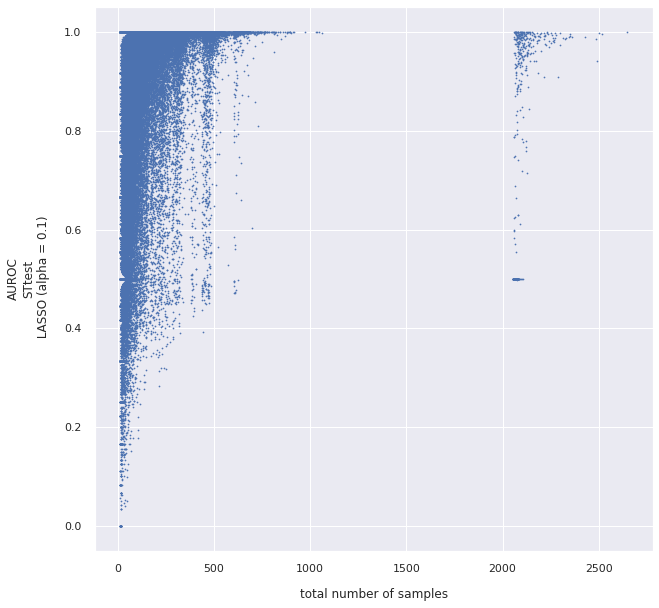

In [36]:
aurocbysize(total, test_allbyall_f2, "total number of samples", "AUROC\nSTtest\n LASSO (alpha = 0.1)", False)

In [37]:
fold2testzeros = np.where(test_allbyall_f2.values[np.triu_indices_from(test_allbyall_f2,k=1)] == 0)

In [38]:
total.values[np.triu_indices_from(total, k=1)][fold2testzeros]

array([16., 16., 16., 17., 19., 13., 13., 14., 13., 13., 15., 17., 16.,
       13., 12., 13., 15., 15., 14., 16.])

In [39]:
test_allbyall_f2.values[np.triu_indices_from(test_allbyall_f2,k=1)][fold1testzeros]

array([0.46666667, 0.61111111, 0.5       , 0.6       , 0.77777778,
       1.        , 1.        , 0.5       , 0.625     , 0.33333333,
       0.77777778, 0.        , 0.66666667, 0.5       , 0.95833333,
       0.41666667, 0.44444444, 0.75      , 0.77777778, 0.26666667,
       0.88888889, 0.77777778])

In [40]:
test_allbyall.values[np.triu_indices_from(test_allbyall,k=1)][fold2testzeros]

array([0.375     , 0.46666667, 0.6       , 0.5       , 0.73809524,
       0.91666667, 0.75      , 0.25      , 0.58333333, 0.33333333,
       1.        , 0.88888889, 0.5       , 0.75      , 0.        ,
       0.5       , 0.34375   , 0.1875    , 0.33333333, 0.13333333])

### cross validation

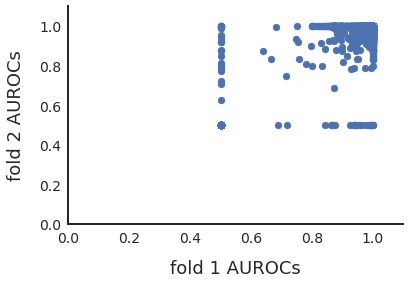

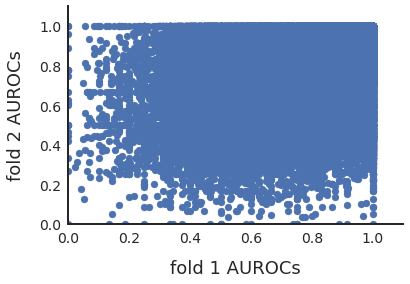

In [56]:
scatfolds(train_allbyall, train_allbyall_f2, 0)
scatfolds(test_allbyall, test_allbyall_f2, 0)

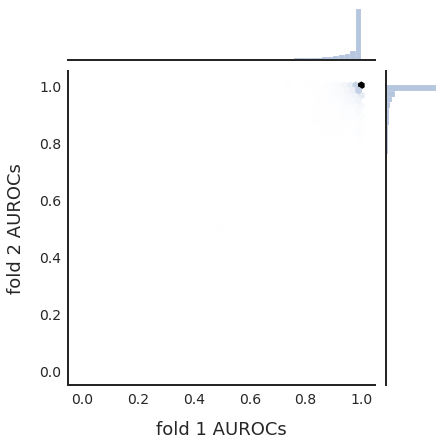

In [57]:
scatfolds2(test_allbyall, test_allbyall_f2, 0)

__average of the two test folds__

In [52]:
test_allbyall_avg = (test_allbyall + test_allbyall_f2)/2

are there any missing values after copying over diagonal?
False


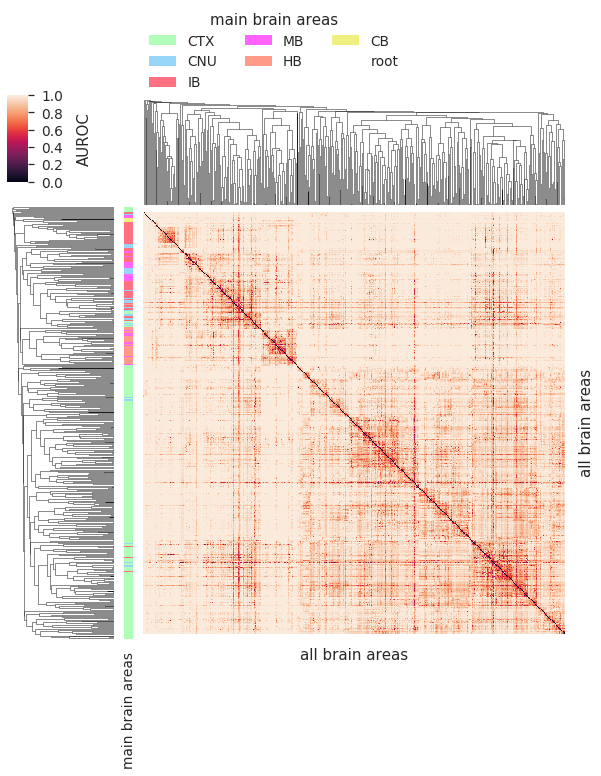

In [58]:
#clustermaps
clustermap(test_allbyall_avg, ontology, "051120_29.png")

number of 0's in upper triangular: 1


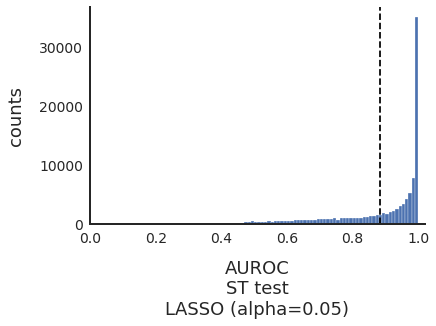

mean AUROC for upper triangular: 0.884537


In [53]:
#upper triangular histogram
uppertrihist(test_allbyall_avg, "AUROC\nST test\nLASSO (alpha=0.05)", 0, 0, 0, False)#"051120_30.pdf")

In [ ]:
#train fold for summary plot
train_allbyall_avg = (train_allbyall + train_allbyall_f2)/2
uppertrihist(train_allbyall_avg,"",0,0,0,False)

# Catin ST LASSO all by all alpha = 0.01

### fold 1

__read in all by all files__

In [14]:
TRAIN_ALLBYALL_PATH = "/home/slu/spatial/data/allbyall_lasso/allbyallST0p01_f1_train040221.csv"
TEST_ALLBYALL_PATH = "/home/slu/spatial/data/allbyall_lasso/allbyallST0p01_f1_test040221.csv"

In [15]:
train_allbyall = pd.read_csv(TRAIN_ALLBYALL_PATH, sep=',')
train_allbyall = train_allbyall.set_index(train_allbyall.columns)

test_allbyall = pd.read_csv(TEST_ALLBYALL_PATH, sep=',')
test_allbyall = test_allbyall.set_index(test_allbyall.columns)

In [16]:
train_allbyall.shape

(461, 461)

__plots__

train set


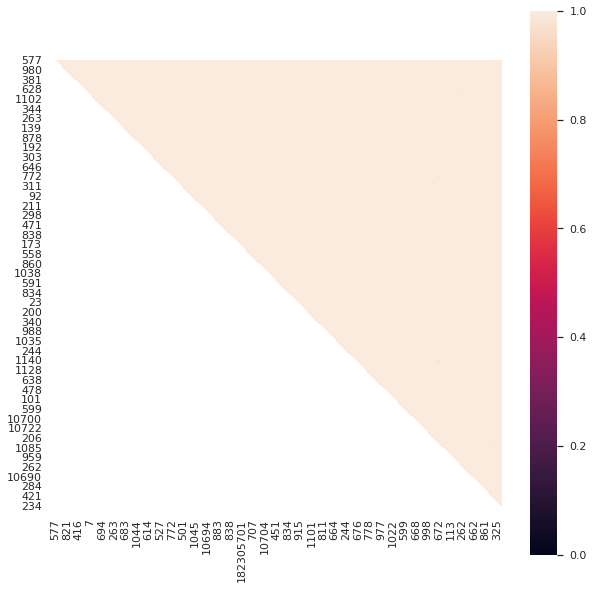

test set


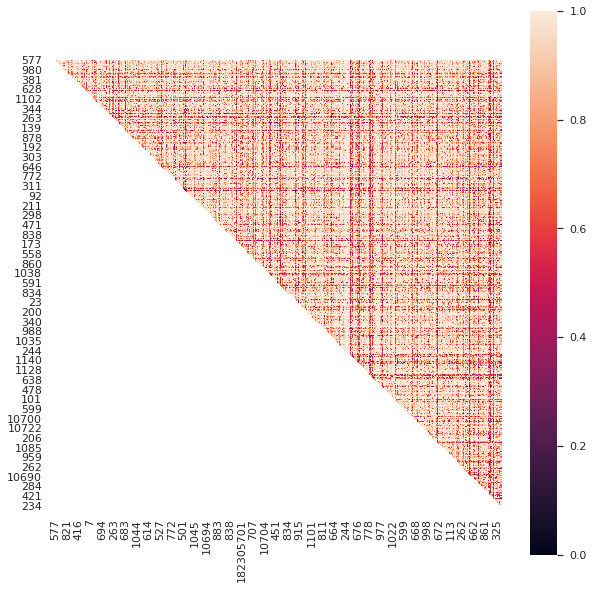

In [17]:
#first look at allbyall outfiles
print("train set")
uppertriheatmap(train_allbyall)
print("test set")
uppertriheatmap(test_allbyall)

are there any missing values after copying over diagonal?
False


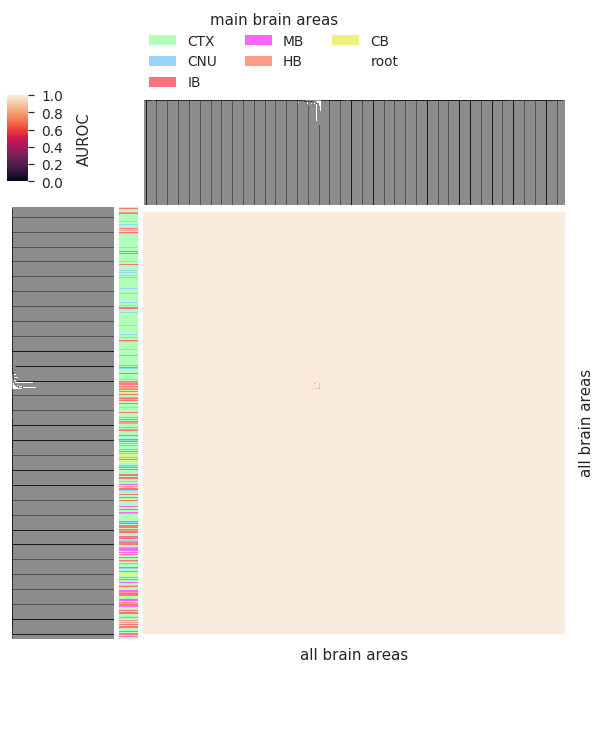

are there any missing values after copying over diagonal?
False


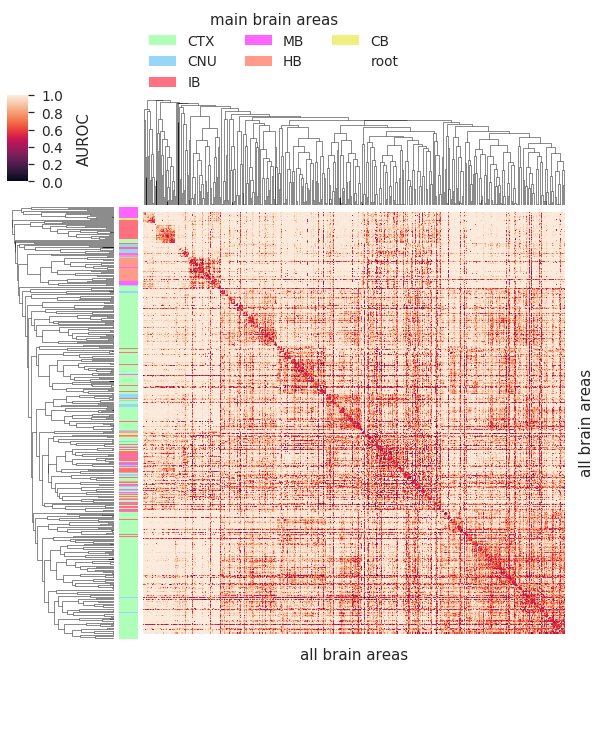

In [18]:
#clustermaps
clustermap(train_allbyall, ontology, False)
clustermap(test_allbyall, ontology, False)

number of 0's in upper triangular: 0


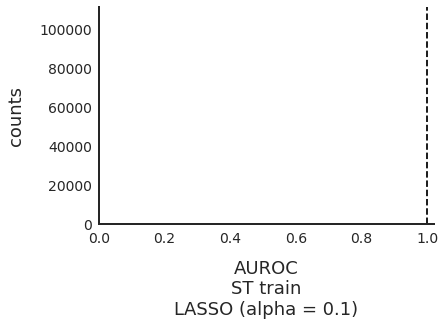

mean AUROC for upper triangular: 0.999986
number of 0's in upper triangular: 18


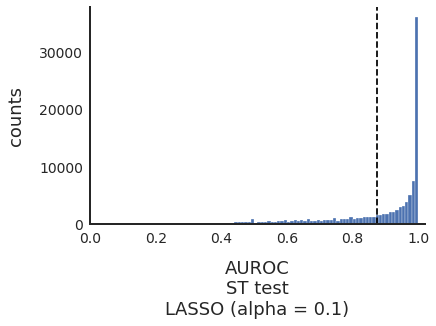

mean AUROC for upper triangular: 0.875355


In [19]:
#upper triangular histogram
uppertrihist(train_allbyall, "AUROC\nST train\nLASSO (alpha = 0.1)", 0, 0, 0, False)#"051120_3.pdf")
uppertrihist(test_allbyall, "AUROC\nST test\nLASSO (alpha = 0.1)", 0, 0, 0, False)#"051120_4.pdf")
#uppertrihist(test_allbyall, "AUROC\nST test\nLASSO (alpha = 0.1)", 1, 0, 100000, "051120_5.pdf")

__probe AUROCs = 0 in test set__

In [20]:
total, minsize, maxsize = getsizes(STpropont, test_allbyall)

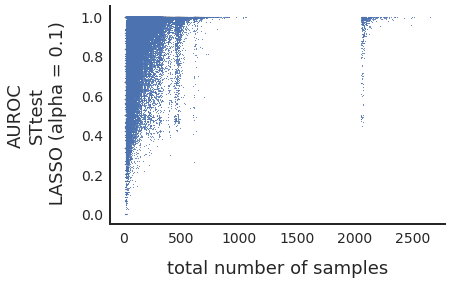

In [21]:
aurocbysize(total, test_allbyall, "total number of samples", "AUROC\nSTtest\n LASSO (alpha = 0.1)", False)

In [22]:
fold1testzeros = np.where(test_allbyall.values[np.triu_indices_from(test_allbyall,k=1)] == 0)

In [23]:
total.values[np.triu_indices_from(total, k=1)][fold1testzeros]

array([16., 12., 17., 13., 13., 19., 25., 12., 12., 13., 12., 14., 22.,
       14., 13., 16., 13., 13.])

### fold 2

__read in all by all files__

In [24]:
TRAIN_ALLBYALL_PATH = "/home/slu/spatial/data/allbyall_lasso/allbyallST0p01_f2_train051121.csv"
TEST_ALLBYALL_PATH = "/home/slu/spatial/data/allbyall_lasso/allbyallST0p01_f2_test051121.csv"

In [25]:
train_allbyall_f2 = pd.read_csv(TRAIN_ALLBYALL_PATH, sep=',')
train_allbyall_f2 = train_allbyall_f2.set_index(train_allbyall_f2.columns)

test_allbyall_f2 = pd.read_csv(TEST_ALLBYALL_PATH, sep=',')
test_allbyall_f2 = test_allbyall_f2.set_index(test_allbyall_f2.columns)

__plots__

train set


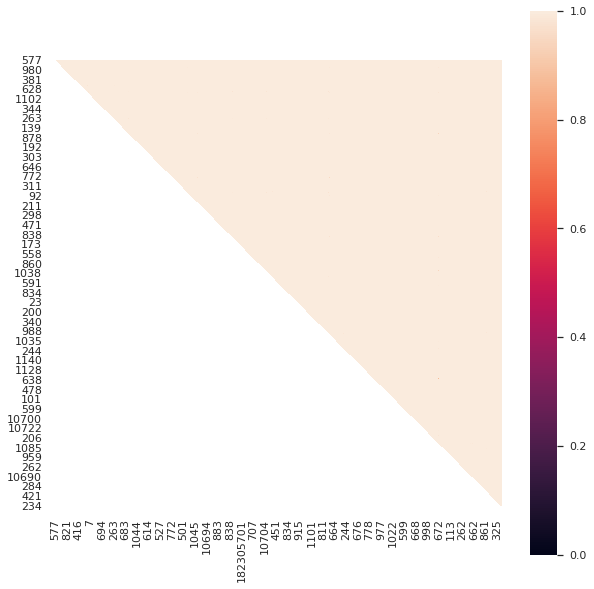

test set


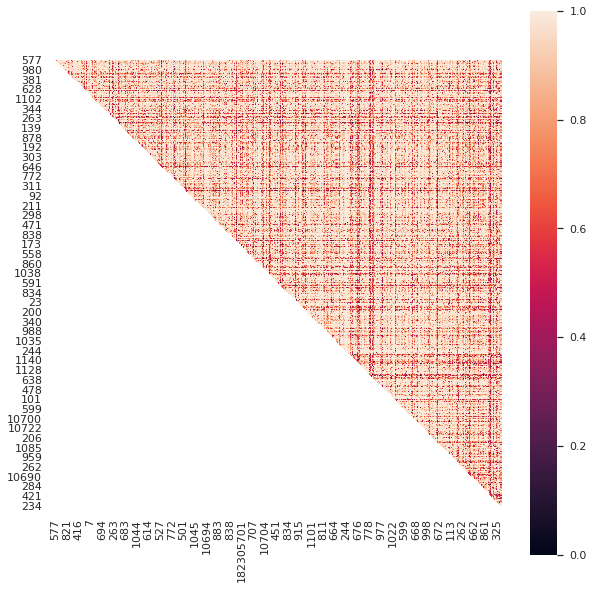

In [26]:
#first look at allbyall outfiles
print("train set")
uppertriheatmap(train_allbyall_f2)
print("test set")
uppertriheatmap(test_allbyall_f2)

are there any missing values after copying over diagonal?
False


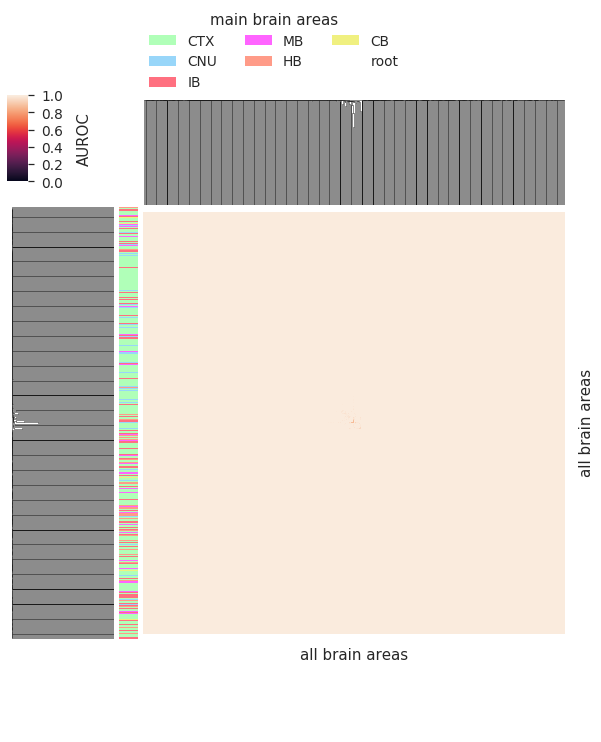

are there any missing values after copying over diagonal?
False


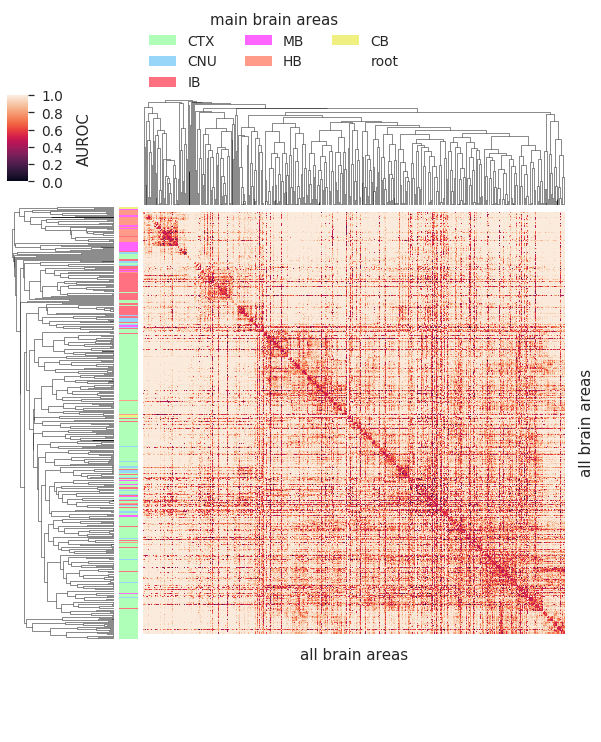

In [27]:
#clustermaps
clustermap(train_allbyall_f2, ontology, False) #"051120_5.png")
clustermap(test_allbyall_f2, ontology, False) #"051120_6.png")

number of 0's in upper triangular: 0


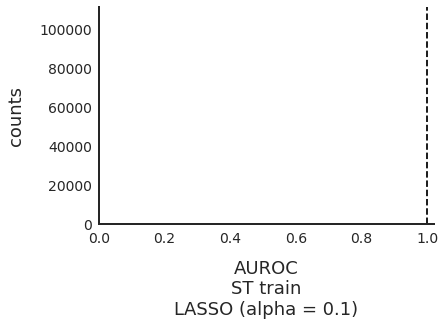

mean AUROC for upper triangular: 0.999988
number of 0's in upper triangular: 22


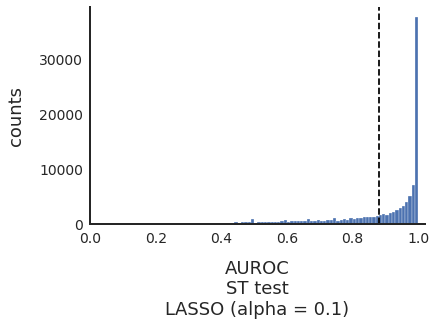

mean AUROC for upper triangular: 0.880344


In [28]:
#upper triangular histogram
uppertrihist(train_allbyall_f2, "AUROC\nST train\nLASSO (alpha = 0.1)", 0, 0, 0, False)#"051120_7.pdf")
uppertrihist(test_allbyall_f2, "AUROC\nST test\nLASSO (alpha = 0.1)", 0, 0, 0, False)#"051120_8.pdf")
#uppertrihist(test_allbyall, "AUROC\nST test\nLASSO (alpha = 0.1)", 1, 0, 100000, "040720_5.pdf")

__probe AUROCs = 0 in test set__

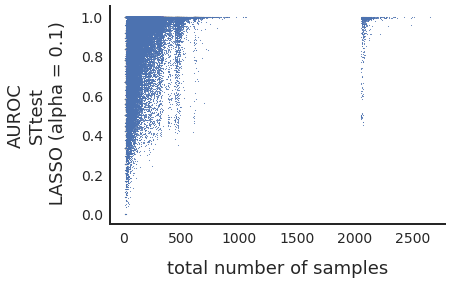

In [29]:
aurocbysize(total, test_allbyall_f2, "total number of samples", "AUROC\nSTtest\n LASSO (alpha = 0.1)", False)

In [30]:
fold2testzeros = np.where(test_allbyall_f2.values[np.triu_indices_from(test_allbyall_f2,k=1)] == 0)

In [31]:
total.values[np.triu_indices_from(total, k=1)][fold2testzeros]

array([16., 16., 17., 13., 19., 13., 13., 14., 14., 15., 13., 13., 15.,
       17., 16., 16., 13., 16., 15., 15., 15., 14.])

In [32]:
test_allbyall_f2.values[np.triu_indices_from(test_allbyall_f2,k=1)][fold1testzeros]

array([0.46666667, 0.55555556, 0.6       , 0.88888889, 1.        ,
       0.47222222, 0.625     , 0.33333333, 0.11111111, 0.66666667,
       0.55555556, 0.58333333, 0.95833333, 0.66666667, 0.77777778,
       0.26666667, 0.77777778, 0.77777778])

In [33]:
test_allbyall.values[np.triu_indices_from(test_allbyall,k=1)][fold2testzeros]

array([0.375     , 0.33333333, 0.55      , 0.58333333, 0.83333333,
       0.83333333, 0.75      , 0.25      , 0.5       , 0.625     ,
       0.58333333, 0.33333333, 1.        , 0.83333333, 0.5       ,
       0.76666667, 0.5       , 0.63333333, 0.375     , 0.73333333,
       0.1875    , 0.33333333])

### cross validation

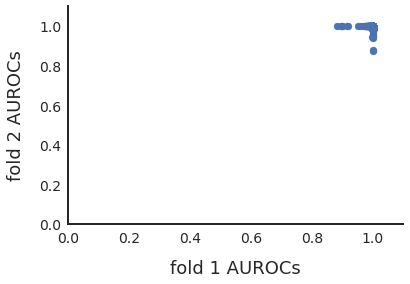

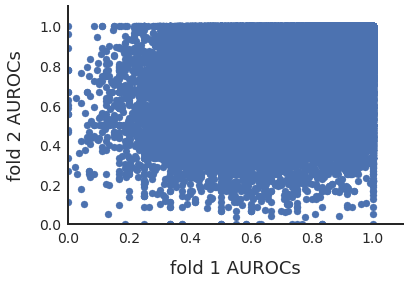

In [34]:
scatfolds(train_allbyall, train_allbyall_f2, 0)
scatfolds(test_allbyall, test_allbyall_f2, 0)

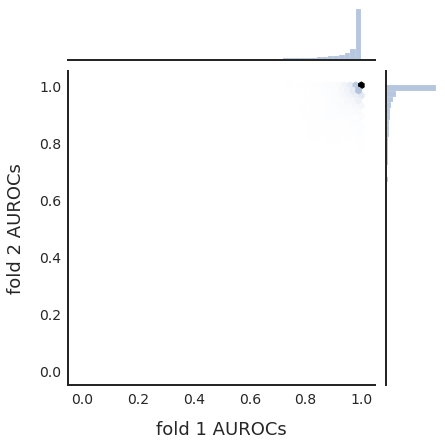

In [35]:
scatfolds2(test_allbyall, test_allbyall_f2, 0)

__average of the two test folds__

In [36]:
test_allbyall_avg = (test_allbyall + test_allbyall_f2)/2
split1 = test_allbyall_avg #new var name to compare to new split later

are there any missing values after copying over diagonal?
False


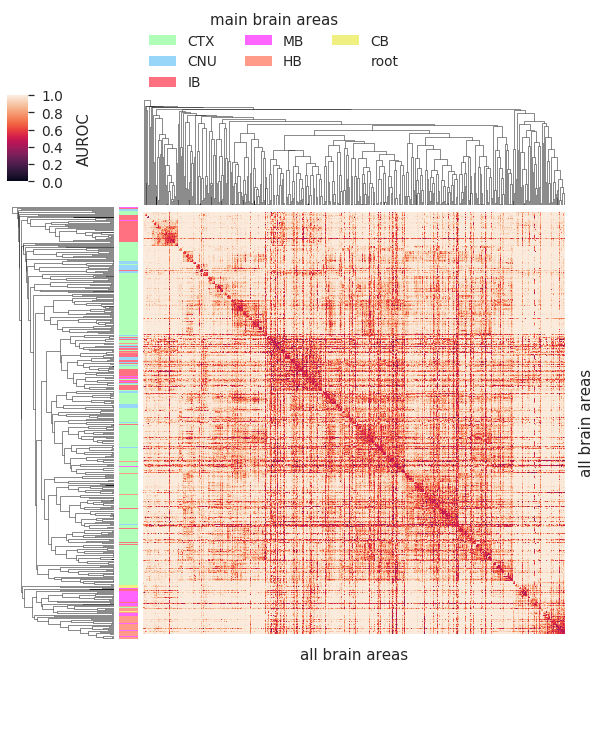

In [37]:
#clustermaps
clustermap(test_allbyall_avg, ontology, "051821_1.png")

number of 0's in upper triangular: 0


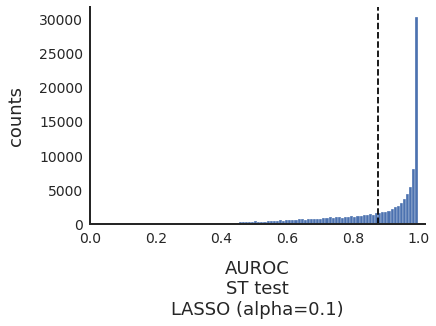

mean AUROC for upper triangular: 0.877849


In [38]:
#upper triangular histogram
uppertrihist(test_allbyall_avg, "AUROC\nST test\nLASSO (alpha=0.1)", 0, 0, 0, "051821_2.pdf")

number of 0's in upper triangular: 0


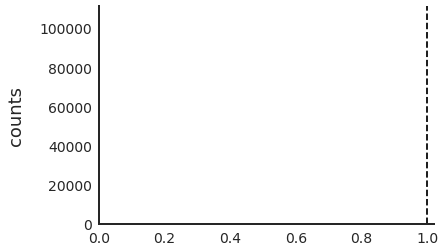

mean AUROC for upper triangular: 0.999987


In [39]:
#train fold for summary plot
train_allbyall_avg = (train_allbyall + train_allbyall_f2)/2
uppertrihist(train_allbyall_avg,"",0,0,0,False)